In [307]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler

### Попробуем понять, что значит каждый столбец
Для помощи использовала https://www.kaggle.com/aaronschlegel/austin-animal-center-shelter-intakes-and-outcomes?select=aac_outcomes.csv

In [1085]:
data.columns

Index(['age_upon_outcome', 'animal_id', 'animal_type', 'breed', 'color',
       'date_of_birth', 'datetime', 'monthyear', 'name', 'outcome_subtype',
       'outcome_type', 'sex_upon_outcome'],
      dtype='object')

* 'age_upon_outcome' - возраст животного на момент принятия решения
* 'animal_id' - id животного
* 'animal_type' - тип животного (Собка/кошка/птица/домашний скот (Livestock)/другое)
* 'breed' - порода
* 'color' - цвет животного
* 'date_of_birth' - дата рождения животного
* 'datetime' - timestamp, когда по животному было принято решение outcome_type
* 'monthyear'-  месяц и год в формате timestamp от datetime
* 'name' - имя животного
* 'outcome_subtype' - более детальное описание outcome_type (где возможно)
* 'outcome_type'- решение о судьбе животного 
* 'sex_upon_outcome' - пол животного + факт стерилизации

In [1086]:
data.sex_upon_outcome.value_counts()

Neutered Male    27784
Spayed Female    25203
Intact Male       9549
Intact Female     9143
Unknown           6575
Name: sex_upon_outcome, dtype: int64

### Теперь расшифруем столбец с целевыми значениями (outcome_type)

In [1087]:
data.outcome_type.value_counts()

Adoption           33112
Transfer           23499
Return to Owner    14354
Euthanasia          6080
Died                 680
Disposal             307
Rto-Adopt            150
Missing               46
Relocate              16
Name: outcome_type, dtype: int64

* Adoption           - животное забрали из приюта домой
* Transfer           - животное было перемещено в место, где его приютят (в сарай)
* Return to Owner    - животное возвращено владельцу
* Euthanasia         - животное усыпили
* Died               - животное умерло
* Disposal           - удаление животного (???)
* Rto-Adopt          - rto - return-to-owner (непонятно, в чем разница с Return to Owner)
* Missing            - животное пропало
* Relocate           - животное переместили

In [308]:
orig_data = pd.read_csv('aac_shelter_outcomes.csv')

In [309]:
orig_data.head()

,age_upon_outcome,animal_id,animal_type,breed,color,date_of_birth,datetime,monthyear,name,outcome_subtype,outcome_type,sex_upon_outcome
0,2 weeks,A684346,Cat,Domestic Shorthair Mix,Orange Tabby,2014-07-07T00:00:00,2014-07-22T16:04:00,2014-07-22T16:04:00,NaN,Partner,Transfer,Intact Male
1,1 year,A666430,Dog,Beagle Mix,White/Brown,2012-11-06T00:00:00,2013-11-07T11:47:00,2013-11-07T11:47:00,Lucy,Partner,Transfer,Spayed Female
2,1 year,A675708,Dog,Pit Bull,Blue/White,2013-03-31T00:00:00,2014-06-03T14:20:00,2014-06-03T14:20:00,*Johnny,NaN,Adoption,Neutered Male
3,9 years,A680386,Dog,Miniature Schnauzer Mix,White,2005-06-02T00:00:00,2014-06-15T15:50:00,2014-06-15T15:50:00,Monday,Partner,Transfer,Neutered Male
4,5 months,A683115,Other,Bat Mix,Brown,2014-01-07T00:00:00,2014-07-07T14:04:00,2014-07-07T14:04:00,NaN,Rabies Risk,Euthanasia,Unknown


In [310]:
# смотрим только на 'Transfer', 'Adoption'

In [311]:
data = pd.DataFrame(orig_data[orig_data.outcome_type.isin(['Transfer', 'Adoption'])])

In [312]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56611 entries, 0 to 78255
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   age_upon_outcome  56609 non-null  object
 1   animal_id         56611 non-null  object
 2   animal_type       56611 non-null  object
 3   breed             56611 non-null  object
 4   color             56611 non-null  object
 5   date_of_birth     56611 non-null  object
 6   datetime          56611 non-null  object
 7   monthyear         56611 non-null  object
 8   name              38660 non-null  object
 9   outcome_subtype   29425 non-null  object
 10  outcome_type      56611 non-null  object
 11  sex_upon_outcome  56611 non-null  object
dtypes: object(12)
memory usage: 5.6+ MB


In [313]:
data.describe()

,age_upon_outcome,animal_id,animal_type,breed,color,date_of_birth,datetime,monthyear,name,outcome_subtype,outcome_type,sex_upon_outcome
count,56609,56611,56611,56611,56611,56611,56611,56611,38660,29425,56611,56611
unique,45,52792,5,1803,475,4883,45158,45158,11989,6,2,5
top,1 year,A732618,Dog,Domestic Shorthair Mix,Black/White,2014-05-05T00:00:00,2016-04-18T00:00:00,2016-04-18T00:00:00,Bella,Partner,Adoption,Neutered Male
freq,9766,6,29570,20809,6111,97,39,39,204,19660,33112,20732


In [314]:
#  Отконвертируем даты

In [315]:
data['date_of_birth'] = pd.to_datetime(data.date_of_birth)
data['datetime'] = pd.to_datetime(data.datetime)

In [316]:
# Месяц и год можно вытащить из datetime - monthyear избыточно

In [317]:
data.drop(['monthyear'], axis=1, inplace=True)

In [318]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56611 entries, 0 to 78255
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   age_upon_outcome  56609 non-null  object        
 1   animal_id         56611 non-null  object        
 2   animal_type       56611 non-null  object        
 3   breed             56611 non-null  object        
 4   color             56611 non-null  object        
 5   date_of_birth     56611 non-null  datetime64[ns]
 6   datetime          56611 non-null  datetime64[ns]
 7   name              38660 non-null  object        
 8   outcome_subtype   29425 non-null  object        
 9   outcome_type      56611 non-null  object        
 10  sex_upon_outcome  56611 non-null  object        
dtypes: datetime64[ns](2), object(9)
memory usage: 5.2+ MB


In [319]:
# describe показал, что animal_id не уникально (??), првоерим - почему

In [320]:
data.animal_id.value_counts().sort_values(ascending=False).head(20)

A732618    6
A739197    5
A738936    5
A740335    5
A741211    5
A683030    5
A703649    5
A732619    4
A731245    4
A690543    4
A709407    4
A696083    4
A716372    4
A717068    4
A675008    4
A671822    4
A671025    4
A721103    4
A696932    4
A742423    4
Name: animal_id, dtype: int64

In [321]:
data[data.animal_id == 'A732618']

,age_upon_outcome,animal_id,animal_type,breed,color,date_of_birth,datetime,name,outcome_subtype,outcome_type,sex_upon_outcome
28695,2 years,A732618,Dog,Pit Bull Mix,Black/White,2014-08-10,2017-05-27 17:26:00,*Sidra,NaN,Adoption,Spayed Female
28757,2 years,A732618,Dog,Pit Bull Mix,Black/White,2014-08-10,2016-12-11 17:13:00,*Sidra,NaN,Adoption,Spayed Female
40568,2 years,A732618,Dog,Pit Bull Mix,Black/White,2014-08-10,2016-10-09 14:48:00,*Sidra,NaN,Adoption,Spayed Female
41989,2 years,A732618,Dog,Pit Bull Mix,Black/White,2014-08-10,2017-04-16 12:37:00,*Sidra,NaN,Adoption,Spayed Female
51908,2 years,A732618,Dog,Pit Bull Mix,Black/White,2014-08-10,2017-01-07 18:38:00,*Sidra,NaN,Adoption,Spayed Female
76797,3 years,A732618,Dog,Pit Bull Mix,Black/White,2014-08-10,2017-12-29 19:13:00,*Sidra,NaN,Adoption,Spayed Female


In [322]:
# несколько записей с разными датами, но одинаоквыми id

In [323]:
data = data.merge(pd.DataFrame(data.animal_id.value_counts().sort_values()).reset_index(), \
          how='left', left_on='animal_id', right_on='index')

In [324]:
data[data.animal_id_y > 1].sort_values('animal_id_x')

,age_upon_outcome,animal_id_x,animal_type,breed,color,date_of_birth,datetime,name,outcome_subtype,outcome_type,sex_upon_outcome,index,animal_id_y
8922,12 years,A282897,Cat,Domestic Shorthair Mix,Black Smoke/White,2001-10-08,2013-12-28 17:05:00,Toby,NaN,Adoption,Neutered Male,A282897,2
22319,13 years,A282897,Cat,Domestic Shorthair Mix,Black Smoke/White,2001-10-08,2015-07-11 16:49:00,Toby,NaN,Adoption,Neutered Male,A282897,2
1578,9 years,A378348,Dog,German Shepherd Mix,Black/Brown,2004-08-07,2014-04-23 07:43:00,Frijolito,Foster,Adoption,Neutered Male,A378348,2
1515,9 years,A378348,Dog,German Shepherd Mix,Black/Brown,2004-08-07,2014-01-19 13:39:00,Frijolito,NaN,Adoption,Neutered Male,A378348,2
9523,9 years,A390222,Dog,Jack Russell Terrier,White/Tan,2004-05-23,2013-12-15 17:10:00,Holly,NaN,Adoption,Spayed Female,A390222,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
56386,1 year,A765295,Dog,Cairn Terrier Mix,Brown,2017-01-17,2018-01-21 18:03:00,Max,NaN,Adoption,Neutered Male,A765295,2
56421,10 months,A765350,Cat,Domestic Shorthair Mix,Gray,2017-03-18,2018-01-27 15:51:00,Luther,NaN,Adoption,Neutered Male,A765350,2
56496,10 months,A765350,Cat,Domestic Shorthair Mix,Gray,2017-03-18,2018-01-29 16:49:00,Luther,NaN,Adoption,Neutered Male,A765350,2
56396,7 years,A765356,Dog,Beagle Mix,White/Tan,2011-01-18,2018-01-26 15:36:00,Pete,NaN,Adoption,Neutered Male,A765356,2


In [325]:
# судя по разным датам - животное несколько раз возвращали в приют ((
# возьмем кол-во возвратов и самую последнюю дату

In [326]:
data = data.merge(data.groupby('animal_id_x')['datetime'].max().reset_index(), \
          how='left', left_on='animal_id_x', right_on='animal_id_x')

In [327]:
data[data.animal_id_y > 1].sort_values('animal_id_x')

,age_upon_outcome,animal_id_x,animal_type,breed,color,date_of_birth,datetime_x,name,outcome_subtype,outcome_type,sex_upon_outcome,index,animal_id_y,datetime_y
8922,12 years,A282897,Cat,Domestic Shorthair Mix,Black Smoke/White,2001-10-08,2013-12-28 17:05:00,Toby,NaN,Adoption,Neutered Male,A282897,2,2015-07-11 16:49:00
22319,13 years,A282897,Cat,Domestic Shorthair Mix,Black Smoke/White,2001-10-08,2015-07-11 16:49:00,Toby,NaN,Adoption,Neutered Male,A282897,2,2015-07-11 16:49:00
1578,9 years,A378348,Dog,German Shepherd Mix,Black/Brown,2004-08-07,2014-04-23 07:43:00,Frijolito,Foster,Adoption,Neutered Male,A378348,2,2014-04-23 07:43:00
1515,9 years,A378348,Dog,German Shepherd Mix,Black/Brown,2004-08-07,2014-01-19 13:39:00,Frijolito,NaN,Adoption,Neutered Male,A378348,2,2014-04-23 07:43:00
9523,9 years,A390222,Dog,Jack Russell Terrier,White/Tan,2004-05-23,2013-12-15 17:10:00,Holly,NaN,Adoption,Spayed Female,A390222,2,2013-12-15 17:10:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56386,1 year,A765295,Dog,Cairn Terrier Mix,Brown,2017-01-17,2018-01-21 18:03:00,Max,NaN,Adoption,Neutered Male,A765295,2,2018-01-26 18:26:00
56421,10 months,A765350,Cat,Domestic Shorthair Mix,Gray,2017-03-18,2018-01-27 15:51:00,Luther,NaN,Adoption,Neutered Male,A765350,2,2018-01-29 16:49:00
56496,10 months,A765350,Cat,Domestic Shorthair Mix,Gray,2017-03-18,2018-01-29 16:49:00,Luther,NaN,Adoption,Neutered Male,A765350,2,2018-01-29 16:49:00
56396,7 years,A765356,Dog,Beagle Mix,White/Tan,2011-01-18,2018-01-26 15:36:00,Pete,NaN,Adoption,Neutered Male,A765356,2,2018-01-26 15:36:00


In [328]:
# теперь уберем дубликаты - записи, в которых дата и макс дата не равны

In [329]:
data = data[(data.datetime_x == data.datetime_y)]

In [330]:
#теперь можем выкинуть animal_id_x, datetime_x (вместо него возьмем макс дату) и переименуем столбцы

In [331]:
data.drop(['animal_id_x', 'index', 'datetime_x'], axis=1, inplace=True)

In [332]:
data.columns = ['age_upon_outcome', 'animal_type', 'breed', 'color', 'date_of_birth',
       'name', 'outcome_subtype', 'outcome_type', 'sex_upon_outcome',
       'num_of_returns', 'max_datetime']

In [333]:
data.head()

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime
0,2 weeks,Cat,Domestic Shorthair Mix,Orange Tabby,2014-07-07,NaN,Partner,Transfer,Intact Male,1,2014-07-22 16:04:00
1,1 year,Dog,Beagle Mix,White/Brown,2012-11-06,Lucy,Partner,Transfer,Spayed Female,1,2013-11-07 11:47:00
2,1 year,Dog,Pit Bull,Blue/White,2013-03-31,*Johnny,NaN,Adoption,Neutered Male,1,2014-06-03 14:20:00
3,9 years,Dog,Miniature Schnauzer Mix,White,2005-06-02,Monday,Partner,Transfer,Neutered Male,1,2014-06-15 15:50:00
4,4 months,Dog,Leonberger Mix,Brown/White,2013-06-03,*Edgar,Partner,Transfer,Intact Male,1,2013-10-07 13:06:00


In [334]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52799 entries, 0 to 56610
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   age_upon_outcome  52797 non-null  object        
 1   animal_type       52799 non-null  object        
 2   breed             52799 non-null  object        
 3   color             52799 non-null  object        
 4   date_of_birth     52799 non-null  datetime64[ns]
 5   name              35029 non-null  object        
 6   outcome_subtype   28904 non-null  object        
 7   outcome_type      52799 non-null  object        
 8   sex_upon_outcome  52799 non-null  object        
 9   num_of_returns    52799 non-null  int64         
 10  max_datetime      52799 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(8)
memory usage: 4.8+ MB


Теперь посмотрим на возраст age_upon_outcome

In [335]:
data[data.age_upon_outcome.isna()]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime
56407,NaN,Bird,Leghorn Mix,White/Red,2017-01-22,NaN,Partner,Transfer,Intact Female,1,2018-01-25 13:23:00
56550,NaN,Dog,Maltese Mix,Buff,2017-01-29,NaN,Partner,Transfer,Intact Male,1,2018-01-31 08:14:00


Тут возраст можно посчитать самим - везде есть дата рождения животного и дата outcome - посчитаем разницу + проверим, что в непустых значениях такая же логика:

In [336]:
data.age_upon_outcome.value_counts()

1 year       8911
2 months     8385
2 years      6492
3 months     3090
1 month      2791
3 years      2730
4 months     2054
4 years      1477
5 months     1450
3 weeks      1392
5 years      1378
6 months     1349
2 weeks      1227
10 months     912
8 months      901
6 years       893
4 weeks       796
8 years       780
7 years       724
7 months      718
10 years      554
1 weeks       460
9 months      451
1 week        400
9 years       359
11 months     339
12 years      266
3 days        217
2 days        200
11 years      175
6 days        138
13 years      131
1 day         126
4 days        119
5 days         91
14 years       79
0 years        77
15 years       75
5 weeks        48
16 years       20
17 years       13
18 years        3
20 years        3
19 years        2
25 years        1
Name: age_upon_outcome, dtype: int64

Видно, что много разных мер - дни, года, недели и т.д. План такой - разделим этот столбец на число и меру (день/неделя и т.д), затем создадим третий столбец, где число будет приведено к одной мере (скорее всего к дням, т.е. это минимальная ед измерения)

In [337]:
data.age_upon_outcome.str.split(' ', 1)

0         [2, weeks]
1          [1, year]
2          [1, year]
3         [9, years]
4        [4, months]
            ...     
56606     [1, month]
56607     [1, month]
56608     [3, years]
56609    [2, months]
56610    [2, months]
Name: age_upon_outcome, Length: 52799, dtype: object

In [338]:
data['age_dig'], data['age_metric'] = data['age_upon_outcome'].str.split(' ').str

/Users/d.kolesova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [339]:
data.head()

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric
0,2 weeks,Cat,Domestic Shorthair Mix,Orange Tabby,2014-07-07,NaN,Partner,Transfer,Intact Male,1,2014-07-22 16:04:00,2,weeks
1,1 year,Dog,Beagle Mix,White/Brown,2012-11-06,Lucy,Partner,Transfer,Spayed Female,1,2013-11-07 11:47:00,1,year
2,1 year,Dog,Pit Bull,Blue/White,2013-03-31,*Johnny,NaN,Adoption,Neutered Male,1,2014-06-03 14:20:00,1,year
3,9 years,Dog,Miniature Schnauzer Mix,White,2005-06-02,Monday,Partner,Transfer,Neutered Male,1,2014-06-15 15:50:00,9,years
4,4 months,Dog,Leonberger Mix,Brown/White,2013-06-03,*Edgar,Partner,Transfer,Intact Male,1,2013-10-07 13:06:00,4,months


In [340]:
data[data.age_dig.isna()]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric
56407,NaN,Bird,Leghorn Mix,White/Red,2017-01-22,NaN,Partner,Transfer,Intact Female,1,2018-01-25 13:23:00,NaN,NaN
56550,NaN,Dog,Maltese Mix,Buff,2017-01-29,NaN,Partner,Transfer,Intact Male,1,2018-01-31 08:14:00,NaN,NaN


In [341]:
data.age_metric.value_counts()

months    19649
years     16232
year       8911
weeks      3923
month      2791
days        765
week        400
day         126
Name: age_metric, dtype: int64

In [342]:
def convert_age_to_days_with_metric(row):
    if row['age_metric'] == 'year' or row['age_metric'] == 'years':
        return row['age_dig'] * 365
    elif row['age_metric'] == 'month' or row['age_metric'] == 'months':
        return row['age_dig'] * 30
    elif row['age_metric'] == 'week' or row['age_metric'] == 'weeks':
        return row['age_dig'] * 7
    elif row['age_metric'] == 'day' or row['age_metric'] == 'days':
        return row['age_dig'] * 1
    else:
        return np.NaN

In [343]:
data.info()    

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52799 entries, 0 to 56610
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   age_upon_outcome  52797 non-null  object        
 1   animal_type       52799 non-null  object        
 2   breed             52799 non-null  object        
 3   color             52799 non-null  object        
 4   date_of_birth     52799 non-null  datetime64[ns]
 5   name              35029 non-null  object        
 6   outcome_subtype   28904 non-null  object        
 7   outcome_type      52799 non-null  object        
 8   sex_upon_outcome  52799 non-null  object        
 9   num_of_returns    52799 non-null  int64         
 10  max_datetime      52799 non-null  datetime64[ns]
 11  age_dig           52797 non-null  object        
 12  age_metric        52797 non-null  object        
dtypes: datetime64[ns](2), int64(1), object(10)
memory usage: 5.6+ MB


In [344]:
data['age_dig'] = data.age_dig.astype('float')

In [345]:
# data['age_convert'] = np.where(data.age_metric.str.contains('year'), data.age_dig * 365, data.age_dig)
data['age_convert'] = data.apply(convert_age_to_days_with_metric, axis=1)

In [346]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52799 entries, 0 to 56610
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   age_upon_outcome  52797 non-null  object        
 1   animal_type       52799 non-null  object        
 2   breed             52799 non-null  object        
 3   color             52799 non-null  object        
 4   date_of_birth     52799 non-null  datetime64[ns]
 5   name              35029 non-null  object        
 6   outcome_subtype   28904 non-null  object        
 7   outcome_type      52799 non-null  object        
 8   sex_upon_outcome  52799 non-null  object        
 9   num_of_returns    52799 non-null  int64         
 10  max_datetime      52799 non-null  datetime64[ns]
 11  age_dig           52797 non-null  float64       
 12  age_metric        52797 non-null  object        
 13  age_convert       52797 non-null  float64       
dtypes: datetime64[ns](2), 

In [347]:
data.head()

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert
0,2 weeks,Cat,Domestic Shorthair Mix,Orange Tabby,2014-07-07,NaN,Partner,Transfer,Intact Male,1,2014-07-22 16:04:00,2.0,weeks,14.0
1,1 year,Dog,Beagle Mix,White/Brown,2012-11-06,Lucy,Partner,Transfer,Spayed Female,1,2013-11-07 11:47:00,1.0,year,365.0
2,1 year,Dog,Pit Bull,Blue/White,2013-03-31,*Johnny,NaN,Adoption,Neutered Male,1,2014-06-03 14:20:00,1.0,year,365.0
3,9 years,Dog,Miniature Schnauzer Mix,White,2005-06-02,Monday,Partner,Transfer,Neutered Male,1,2014-06-15 15:50:00,9.0,years,3285.0
4,4 months,Dog,Leonberger Mix,Brown/White,2013-06-03,*Edgar,Partner,Transfer,Intact Male,1,2013-10-07 13:06:00,4.0,months,120.0


In [348]:
data['age_in_days'] = (data.max_datetime - data.date_of_birth).dt.days

In [349]:
data.head()

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
0,2 weeks,Cat,Domestic Shorthair Mix,Orange Tabby,2014-07-07,NaN,Partner,Transfer,Intact Male,1,2014-07-22 16:04:00,2.0,weeks,14.0,15
1,1 year,Dog,Beagle Mix,White/Brown,2012-11-06,Lucy,Partner,Transfer,Spayed Female,1,2013-11-07 11:47:00,1.0,year,365.0,366
2,1 year,Dog,Pit Bull,Blue/White,2013-03-31,*Johnny,NaN,Adoption,Neutered Male,1,2014-06-03 14:20:00,1.0,year,365.0,429
3,9 years,Dog,Miniature Schnauzer Mix,White,2005-06-02,Monday,Partner,Transfer,Neutered Male,1,2014-06-15 15:50:00,9.0,years,3285.0,3300
4,4 months,Dog,Leonberger Mix,Brown/White,2013-06-03,*Edgar,Partner,Transfer,Intact Male,1,2013-10-07 13:06:00,4.0,months,120.0,126


Посмотрим на наши пропуски:

In [350]:
data[data.age_upon_outcome.isna()]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
56407,NaN,Bird,Leghorn Mix,White/Red,2017-01-22,NaN,Partner,Transfer,Intact Female,1,2018-01-25 13:23:00,NaN,NaN,NaN,368
56550,NaN,Dog,Maltese Mix,Buff,2017-01-29,NaN,Partner,Transfer,Intact Male,1,2018-01-31 08:14:00,NaN,NaN,NaN,367


In [351]:
# Поскольку пропусков мало, можно не изобретать велосипед, а хардкодом записать 1 год. Вообще можно было бы убрать столбец age_upon_outcome совсем, так как
# у нас уже есть более точый возраст в днях, но мне нраивтся готовая группировка.

In [352]:
data['age_upon_outcome'] = data.age_upon_outcome.apply(lambda x: '1 year' if pd.isna(x) else x)

In [353]:
data[data.index.isin([56407, 56550])]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
56407,1 year,Bird,Leghorn Mix,White/Red,2017-01-22,NaN,Partner,Transfer,Intact Female,1,2018-01-25 13:23:00,NaN,NaN,NaN,368
56550,1 year,Dog,Maltese Mix,Buff,2017-01-29,NaN,Partner,Transfer,Intact Male,1,2018-01-31 08:14:00,NaN,NaN,NaN,367


In [354]:
data.age_upon_outcome.value_counts()

1 year       8913
2 months     8385
2 years      6492
3 months     3090
1 month      2791
3 years      2730
4 months     2054
4 years      1477
5 months     1450
3 weeks      1392
5 years      1378
6 months     1349
2 weeks      1227
10 months     912
8 months      901
6 years       893
4 weeks       796
8 years       780
7 years       724
7 months      718
10 years      554
1 weeks       460
9 months      451
1 week        400
9 years       359
11 months     339
12 years      266
3 days        217
2 days        200
11 years      175
6 days        138
13 years      131
1 day         126
4 days        119
5 days         91
14 years       79
0 years        77
15 years       75
5 weeks        48
16 years       20
17 years       13
18 years        3
20 years        3
19 years        2
25 years        1
Name: age_upon_outcome, dtype: int64

In [355]:
# приведем в порядок обозначения (year - years и т.д.)

In [356]:
data.groupby('age_upon_outcome')['age_in_days'].max()

age_upon_outcome
0 years         0
1 day           1
1 month        61
1 week          7
1 weeks        13
1 year        729
10 months     334
10 years     4008
11 months     364
11 years     4374
12 years     4738
13 years     5108
14 years     5471
15 years     5836
16 years     6065
17 years     6504
18 years     6733
19 years     6942
2 days          2
2 months       91
2 weeks        20
2 years      1094
20 years     7311
25 years     9137
3 days          3
3 months      121
3 weeks        27
3 years      1459
4 days          4
4 months      152
4 weeks        34
4 years      1824
5 days          5
5 months      182
5 weeks        35
5 years      2189
6 days          6
6 months      212
6 years      2554
7 months      243
7 years      2918
8 months      273
8 years      3280
9 months      304
9 years      3649
Name: age_in_days, dtype: int64

In [357]:
data.age_metric.value_counts()

months    19649
years     16232
year       8911
weeks      3923
month      2791
days        765
week        400
day         126
Name: age_metric, dtype: int64

In [358]:
data.age_metric.str.replace('s', '').value_counts()

year     25143
month    22440
week      4323
day        891
Name: age_metric, dtype: int64

In [359]:
data['age_upon_outcome'] = data.age_upon_outcome.str.replace('s', '')

In [360]:
data['age_metric'] = data.age_metric.str.replace('s', '')

In [361]:
data.age_upon_outcome.value_counts()

1 year      8913
2 month     8385
2 year      6492
3 month     3090
1 month     2791
3 year      2730
4 month     2054
4 year      1477
5 month     1450
3 week      1392
5 year      1378
6 month     1349
2 week      1227
10 month     912
8 month      901
6 year       893
1 week       860
4 week       796
8 year       780
7 year       724
7 month      718
10 year      554
9 month      451
9 year       359
11 month     339
12 year      266
3 day        217
2 day        200
11 year      175
6 day        138
13 year      131
1 day        126
4 day        119
5 day         91
14 year       79
0 year        77
15 year       75
5 week        48
16 year       20
17 year       13
20 year        3
18 year        3
19 year        2
25 year        1
Name: age_upon_outcome, dtype: int64

In [362]:
# Все равно много значений - будем делать корзины до 1 года, до 2 лет, до 3 лет, до 4 лет, а дальше посмотрим

In [363]:
data.describe()

,num_of_returns,age_dig,age_convert,age_in_days
count,52799.000000,52797.000000,52797.000000,52799.000000
mean,1.072463,3.285641,587.681289,620.492945
std,0.295962,2.624408,887.390375,906.212652
min,1.000000,0.000000,0.000000,-123.000000
25%,1.000000,2.000000,60.000000,77.000000
50%,1.000000,2.000000,270.000000,295.000000
75%,1.000000,4.000000,730.000000,739.000000
max,6.000000,25.000000,9125.000000,9137.000000


In [364]:
# Вообще очень большой разрыв между 75 квантилем (739 дней ~ 2 года) и 25 годами 

In [365]:
data.age_in_days.quantile(0.995)
# /365

4770.0

In [366]:
25 * 365

9125

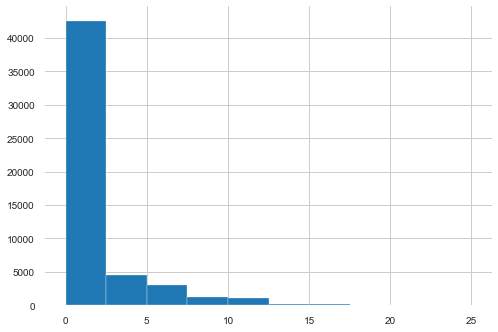

In [367]:
round(data.age_in_days/365).hist()

In [368]:
data[data.age_in_days > 9000]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
45460,25 year,Bird,Cockatoo,White/Orange,1991-12-11,Sweet Pea,Partner,Transfer,Intact Female,1,2016-12-16,25.0,year,9125.0,9137


Уберем птицу в возрасте 25 лет

In [369]:
data = data[data.age_in_days <= 9000]

In [370]:
data.describe()

,num_of_returns,age_dig,age_convert,age_in_days
count,52798.000000,52796.00000,52796.000000,52798.000000
mean,1.072465,3.28523,587.519585,620.331641
std,0.295964,2.62273,886.620563,905.462937
min,1.000000,0.00000,0.000000,-123.000000
25%,1.000000,2.00000,60.000000,77.000000
50%,1.000000,2.00000,270.000000,295.000000
75%,1.000000,4.00000,730.000000,739.000000
max,6.000000,20.00000,7300.000000,7311.000000


In [371]:
data[data.age_in_days > 4800]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
114,15 year,Cat,Domestic Shorthair Mix,Blue Tabby,1999-05-06,NaN,Partner,Transfer,Intact Female,1,2014-05-14 15:30:00,15.0,year,5475.0,5487
180,16 year,Cat,Siamese Mix,Lynx Point,1998-01-11,Laurel,NaN,Adoption,Spayed Female,2,2014-02-12 18:34:00,16.0,year,5840.0,5876
431,14 year,Dog,Dachshund,Red/White,2000-06-01,Winston,Partner,Transfer,Neutered Male,1,2014-06-03 12:26:00,14.0,year,5110.0,5115
455,15 year,Cat,Domestic Shorthair Mix,Tortie,1999-10-18,Mitzy,Partner,Transfer,Spayed Female,1,2014-10-22 15:08:00,15.0,year,5475.0,5483
539,14 year,Cat,Domestic Shorthair Mix,Orange Tabby,2000-10-18,Rusty,Partner,Transfer,Neutered Male,1,2014-10-22 15:08:00,14.0,year,5110.0,5117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55999,14 year,Dog,Chihuahua Shorthair Mix,Tan,2004-01-10,Lila,NaN,Adoption,Spayed Female,2,2018-01-13 17:54:00,14.0,year,5110.0,5117
56220,15 year,Dog,Chihuahua Shorthair Mix,White/Brown,2003-01-03,Blanche D.,NaN,Adoption,Intact Female,1,2018-01-20 17:49:00,15.0,year,5475.0,5496
56523,13 year,Cat,Abyssinian Mix,Brown Tabby/Agouti,2004-04-13,Jewel,NaN,Adoption,Spayed Female,1,2018-01-28 17:51:00,13.0,year,4745.0,5038
56549,14 year,Dog,Shih Tzu Mix,White/Tan,2004-01-27,NaN,Partner,Transfer,Neutered Male,1,2018-01-29 12:18:00,14.0,year,5110.0,5116


In [372]:
data.shape

(52798, 15)

In [373]:
#  Кажется, мы можем убрать 243 строки, у которых возраст > 4800 (при том, что 0.995 квратиль равен 4769)

In [374]:
data = data[data.age_in_days <= 4800]

In [375]:
data.describe()

,num_of_returns,age_dig,age_convert,age_in_days
count,52555.000000,52553.000000,52553.000000,52555.000000
mean,1.072438,3.232908,565.594048,598.156236
std,0.295957,2.511449,827.146317,846.051571
min,1.000000,0.000000,0.000000,-123.000000
25%,1.000000,2.000000,60.000000,77.000000
50%,1.000000,2.000000,270.000000,283.000000
75%,1.000000,4.000000,730.000000,738.000000
max,6.000000,13.000000,4745.000000,4800.000000


In [376]:
# Теперь посомтрим на отрицательное значение

In [377]:
data[data.age_in_days < 0]

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
14128,0 year,Dog,Labrador Retriever Mix,Black/White,2014-04-03,Sadie,Partner,Transfer,Spayed Female,1,2013-12-01 13:19:00,0.0,year,0.0,-123
36359,0 year,Cat,Domestic Shorthair Mix,Tortie,2015-07-06,NaN,Partner,Transfer,Unknown,1,2015-07-05 14:46:00,0.0,year,0.0,-1
38139,0 year,Cat,Domestic Shorthair Mix,Orange Tabby,2016-10-28,NaN,Partner,Transfer,Intact Male,1,2016-10-04 15:13:00,0.0,year,0.0,-24


In [378]:
# Таких всего три и их судьбу решили еще до их рождения - уберем

In [379]:
data = data[data.age_in_days >= 0 ]

In [380]:
data.describe()

,num_of_returns,age_dig,age_convert,age_in_days
count,52552.000000,52550.000000,52550.000000,52552.000000
mean,1.072443,3.233092,565.626337,598.193199
std,0.295965,2.511402,827.158887,846.061481
min,1.000000,0.000000,0.000000,0.000000
25%,1.000000,2.000000,60.000000,77.000000
50%,1.000000,2.000000,270.000000,283.000000
75%,1.000000,4.000000,730.000000,738.000000
max,6.000000,13.000000,4745.000000,4800.000000


In [381]:
# Теперь можно делить

In [382]:
data.age_upon_outcome.value_counts()

1 year      8913
2 month     8385
2 year      6492
3 month     3090
1 month     2791
3 year      2730
4 month     2054
4 year      1477
5 month     1450
3 week      1392
5 year      1378
6 month     1349
2 week      1227
10 month     912
8 month      901
6 year       893
1 week       860
4 week       796
8 year       780
7 year       724
7 month      718
10 year      554
9 month      451
9 year       359
11 month     339
12 year      266
3 day        217
2 day        200
11 year      175
6 day        138
1 day        126
4 day        119
5 day         91
13 year       83
0 year        74
5 week        48
Name: age_upon_outcome, dtype: int64

Можно все дни и недели записать в 1 месяц, так как они все меньше месяца

In [383]:
data[data.age_metric == 'week']['age_dig'].unique()

array([2., 3., 4., 1., 5.])

In [384]:
data[data.age_upon_outcome == '5 week'].head()

,age_upon_outcome,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_dig,age_metric,age_convert,age_in_days
2323,5 week,Dog,Australian Cattle Dog Mix,Tricolor,2014-05-20,NaN,Partner,Transfer,Intact Female,1,2014-06-24 16:34:00,5.0,week,35.0,35
8274,5 week,Dog,Australian Cattle Dog Mix,Black/Brown,2014-05-20,NaN,Partner,Transfer,Intact Female,1,2014-06-24 16:33:00,5.0,week,35.0,35
10938,5 week,Dog,Australian Cattle Dog Mix,Tricolor,2014-05-20,NaN,Partner,Transfer,Intact Female,1,2014-06-24 16:34:00,5.0,week,35.0,35
12985,5 week,Cat,Domestic Medium Hair Mix,Orange Tabby,2014-05-15,NaN,Partner,Transfer,Intact Male,1,2014-06-19 14:52:00,5.0,week,35.0,35
15891,5 week,Cat,Domestic Medium Hair,Tortie/White,2014-06-18,NaN,Partner,Transfer,Intact Female,1,2014-07-23 14:39:00,5.0,week,35.0,35


In [385]:
data.groupby('age_upon_outcome')['age_in_days'].max()

age_upon_outcome
0 year         0
1 day          1
1 month       61
1 week        13
1 year       729
10 month     334
10 year     4008
11 month     364
11 year     4374
12 year     4738
13 year     4800
2 day          2
2 month       91
2 week        20
2 year      1094
3 day          3
3 month      121
3 week        27
3 year      1459
4 day          4
4 month      152
4 week        34
4 year      1824
5 day          5
5 month      182
5 week        35
5 year      2189
6 day          6
6 month      212
6 year      2554
7 month      243
7 year      2918
8 month      273
8 year      3280
9 month      304
9 year      3649
Name: age_in_days, dtype: int64

In [386]:
366*12

4392

In [387]:
# Первый вариант

In [388]:
bins = [0, 61, 123, 154, 185, 217, 247, 278, 309, 340, 371, 731, 1097, 1463, 1829, 2195, 2561, 2927, 3293, 3659\
        , 4025\
       ,4391, 4800]
data['age_binned'] = pd.cut(data.age_in_days, bins)

In [389]:
data.age_binned.value_counts()

(61, 123]       11696
(0, 61]          8005
(731, 1097]      6272
(371, 731]       5931
(340, 371]       3610
(1097, 1463]     2660
(123, 154]       2033
(154, 185]       1530
(1463, 1829]     1519
(1829, 2195]     1357
(185, 217]       1286
(2195, 2561]      899
(247, 278]        765
(217, 247]        761
(2561, 2927]      749
(278, 309]        716
(2927, 3293]      699
(309, 340]        647
(3293, 3659]      459
(3659, 4025]      402
(4025, 4391]      242
(4391, 4800]      240
Name: age_binned, dtype: int64

In [390]:
# Второй вариант

In [391]:
bins = [0, 61, 123, 154, 340, 371, 731, 1097, 1463, 1829, 2195, 4800]
data['age_binned'] = pd.cut(data.age_in_days, bins, include_lowest=True)

In [392]:
data.age_binned.value_counts()

(61.0, 123.0]       11696
(-0.001, 61.0]       8079
(731.0, 1097.0]      6272
(371.0, 731.0]       5931
(154.0, 340.0]       5705
(2195.0, 4800.0]     3690
(340.0, 371.0]       3610
(1097.0, 1463.0]     2660
(123.0, 154.0]       2033
(1463.0, 1829.0]     1519
(1829.0, 2195.0]     1357
Name: age_binned, dtype: int64

In [393]:
data['age_min'] = data.age_binned.apply(lambda x: x.left).astype(int)
data['age_max'] = data.age_binned.apply(lambda x: x.right).astype(int)

In [394]:
data.age_max.value_counts()

123     11696
61       8079
1097     6272
731      5931
340      5705
4800     3690
371      3610
1463     2660
154      2033
1829     1519
2195     1357
Name: age_max, dtype: int64

In [395]:
data['age_in_years'] = round(data.age_in_days/365)

In [396]:
data.age_in_years.value_counts()

0.0     23058
1.0     12322
2.0      7203
3.0      2957
4.0      1579
5.0      1426
6.0       911
8.0       774
7.0       767
10.0      562
9.0       407
12.0      261
11.0      200
13.0      125
Name: age_in_years, dtype: int64

In [397]:
# Мы все взяли из возраста - можно удалять ненужное

In [398]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52552 entries, 0 to 56610
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   age_upon_outcome  52552 non-null  object        
 1   animal_type       52552 non-null  object        
 2   breed             52552 non-null  object        
 3   color             52552 non-null  object        
 4   date_of_birth     52552 non-null  datetime64[ns]
 5   name              34805 non-null  object        
 6   outcome_subtype   28734 non-null  object        
 7   outcome_type      52552 non-null  object        
 8   sex_upon_outcome  52552 non-null  object        
 9   num_of_returns    52552 non-null  int64         
 10  max_datetime      52552 non-null  datetime64[ns]
 11  age_dig           52550 non-null  float64       
 12  age_metric        52550 non-null  object        
 13  age_convert       52550 non-null  float64       
 14  age_in_days       5255

In [399]:
data.drop(['age_upon_outcome', 'age_dig', 'age_metric', 'age_convert'], axis=1, inplace=True)

In [400]:
data.head()

,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_in_days,age_binned,age_min,age_max,age_in_years
0,Cat,Domestic Shorthair Mix,Orange Tabby,2014-07-07,NaN,Partner,Transfer,Intact Male,1,2014-07-22 16:04:00,15,"(-0.001, 61.0]",0,61,0.0
1,Dog,Beagle Mix,White/Brown,2012-11-06,Lucy,Partner,Transfer,Spayed Female,1,2013-11-07 11:47:00,366,"(340.0, 371.0]",340,371,1.0
2,Dog,Pit Bull,Blue/White,2013-03-31,*Johnny,NaN,Adoption,Neutered Male,1,2014-06-03 14:20:00,429,"(371.0, 731.0]",371,731,1.0
3,Dog,Miniature Schnauzer Mix,White,2005-06-02,Monday,Partner,Transfer,Neutered Male,1,2014-06-15 15:50:00,3300,"(2195.0, 4800.0]",2195,4800,9.0
4,Dog,Leonberger Mix,Brown/White,2013-06-03,*Edgar,Partner,Transfer,Intact Male,1,2013-10-07 13:06:00,126,"(123.0, 154.0]",123,154,0.0


In [401]:
data.describe(include='all')

,animal_type,breed,color,date_of_birth,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,max_datetime,age_in_days,age_binned,age_min,age_max,age_in_years
count,52552,52552,52552,52552,34805,28734,52552,52552,52552.000000,52552,52552.000000,52552,52552.000000,52552.000000,52552.000000
unique,5,1803,474,4695,11945,6,2,5,NaN,41591,NaN,11,NaN,NaN,NaN
top,Dog,Domestic Shorthair Mix,Black/White,2014-05-05 00:00:00,Bella,Partner,Adoption,Neutered Male,NaN,2016-04-18 00:00:00,NaN,"(61.0, 123.0]",NaN,NaN,NaN
freq,26621,19989,5627,92,172,19468,29408,18745,NaN,39,NaN,11696,NaN,NaN,NaN
first,NaN,NaN,NaN,2000-10-21 00:00:00,NaN,NaN,NaN,NaN,NaN,2013-10-01 09:31:00,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2017-12-25 00:00:00,NaN,NaN,NaN,NaN,NaN,2018-02-01 18:44:00,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.072443,NaN,598.193199,NaN,486.690097,839.167111,1.566296
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.295965,NaN,846.061481,NaN,633.910101,1214.019582,2.356122
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,0.000000,NaN,0.000000,61.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,77.000000,NaN,61.000000,123.000000,0.000000


In [402]:
# Даты больше не нужны

In [403]:
data.drop(['date_of_birth', 'max_datetime'], axis=1, inplace=True)

In [404]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52552 entries, 0 to 56610
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   animal_type       52552 non-null  object  
 1   breed             52552 non-null  object  
 2   color             52552 non-null  object  
 3   name              34805 non-null  object  
 4   outcome_subtype   28734 non-null  object  
 5   outcome_type      52552 non-null  object  
 6   sex_upon_outcome  52552 non-null  object  
 7   num_of_returns    52552 non-null  int64   
 8   age_in_days       52552 non-null  int64   
 9   age_binned        52552 non-null  category
 10  age_min           52552 non-null  int64   
 11  age_max           52552 non-null  int64   
 12  age_in_years      52552 non-null  float64 
dtypes: category(1), float64(1), int64(4), object(7)
memory usage: 5.3+ MB


In [405]:
data.breed.value_counts()

Domestic Shorthair Mix                      19989
Chihuahua Shorthair Mix                      3165
Pit Bull Mix                                 3079
Labrador Retriever Mix                       2947
Domestic Medium Hair Mix                     1962
                                            ...  
Australian Kelpie/Alaskan Husky                 1
Whippet/German Shepherd                         1
Anatol Shepherd/German Shorthair Pointer        1
Bruss Griffon/Yorkshire Terrier                 1
Catahoula/Mastiff                               1
Name: breed, Length: 1803, dtype: int64

In [406]:
data.breed.str.replace(' Mix', '').value_counts()

Domestic Shorthair                        20296
Chihuahua Shorthair                        3278
Pit Bull                                   3173
Labrador Retriever                         3062
Domestic Medium Hair                       2080
                                          ...  
Bluetick Hound/Australian Cattle Dog          1
Dachshund Wirehair/West Highland              1
Siberian Husky/Alaskan Malamute               1
Golden Retriever/Australian Cattle Dog        1
English Coonhound/German Shepherd             1
Name: breed, Length: 1622, dtype: int64

Уберем MIX

In [412]:
data['is_mix_in_breed'] = data.breed.apply(lambda x: 1 if ' Mix' in x else 0)

In [413]:
data[data.is_mix_in_breed == 1].head()

,animal_type,breed,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed
0,Cat,Domestic Shorthair Mix,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1
1,Dog,Beagle Mix,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1
3,Dog,Miniature Schnauzer Mix,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1
4,Dog,Leonberger Mix,Brown/White,*Edgar,Partner,Transfer,Intact Male,1,126,"(123.0, 154.0]",123,154,0.0,1
5,Dog,Chihuahua Shorthair Mix,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1


In [414]:
#Теперь уберем MIX

In [415]:
data['breed'] = data.breed.str.replace(' Mix', '')

In [416]:
data.breed.str.count(' ').sort_values()

13930    0
34498    0
7872     0
21572    0
7865     0
        ..
14727    5
4768     5
6599     5
56136    5
19081    5
Name: breed, Length: 52552, dtype: int64

In [417]:
data.breed.str.count('/').sort_values()

0        0
37055    0
37056    0
37057    0
37058    0
        ..
420      2
42430    2
11858    2
15451    2
54686    2
Name: breed, Length: 52552, dtype: int64

In [418]:
data['breed_1'], data['breed_2'] = data.breed.str.split('/', 1).str

/Users/d.kolesova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [419]:
data.breed_2.value_counts()

Labrador Retriever     562
Chihuahua Shorthair    440
Dachshund              276
Pit Bull               267
German Shepherd        222
                      ... 
Field Spaniel            1
Neapolitan Mastiff       1
Feist                    1
Irish Terrier            1
Irish Setter             1
Name: breed_2, Length: 164, dtype: int64

In [420]:
data[data.breed.str.contains('/')].head()

,animal_type,breed,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1,breed_2
8,Dog,Papillon/Border Collie,Black/White,Fancy,Partner,Transfer,Neutered Male,1,759,"(731.0, 1097.0]",731,1097,2.0,0,Papillon,Border Collie
9,Dog,Chihuahua Shorthair/Pomeranian,Black,Kash,Foster,Adoption,Neutered Male,1,80,"(61.0, 123.0]",61,123,0.0,0,Chihuahua Shorthair,Pomeranian
13,Dog,German Shepherd/Labrador Retriever,Black/White,*Bonnie,Foster,Adoption,Spayed Female,1,63,"(61.0, 123.0]",61,123,0.0,0,German Shepherd,Labrador Retriever
35,Dog,Cardigan Welsh Corgi/English Setter,White/Black,Aria,NaN,Adoption,Spayed Female,1,96,"(61.0, 123.0]",61,123,0.0,0,Cardigan Welsh Corgi,English Setter
48,Dog,Australian Shepherd/Australian Cattle Dog,Blue Merle/White,Maggie,NaN,Adoption,Spayed Female,1,310,"(154.0, 340.0]",154,340,1.0,0,Australian Shepherd,Australian Cattle Dog


In [421]:
data.breed_1.str.count(' ').sort_values()

14377    0
51030    0
44609    0
24285    0
19014    0
        ..
13196    4
49180    4
17298    4
14727    4
22330    4
Name: breed_1, Length: 52552, dtype: int64

In [422]:
data.breed_1.str.split(' ', -1).str[-1]

0         Shorthair
1            Beagle
2              Bull
3         Schnauzer
4        Leonberger
            ...    
56606     Retriever
56607     Retriever
56608       Mastiff
56609     Schnauzer
56610     Retriever
Name: breed_1, Length: 52552, dtype: object

In [423]:
data['breed_1_type'] = data.breed_1.str.split(' ', -1).str[-1]
data['breed_2_type'] = data.breed_2.str.split(' ', -1).str[-1]

In [424]:
data.head()

,animal_type,breed,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1,breed_2,breed_1_type,breed_2_type
0,Cat,Domestic Shorthair,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,Domestic Shorthair,NaN,Shorthair,NaN
1,Dog,Beagle,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,NaN,Beagle,NaN
2,Dog,Pit Bull,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,Pit Bull,NaN,Bull,NaN
3,Dog,Miniature Schnauzer,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Miniature Schnauzer,NaN,Schnauzer,NaN
4,Dog,Leonberger,Brown/White,*Edgar,Partner,Transfer,Intact Male,1,126,"(123.0, 154.0]",123,154,0.0,1,Leonberger,NaN,Leonberger,NaN


In [425]:
data.breed_1_type.value_counts()

Shorthair    24281
Retriever     4044
Bull          3320
Terrier       2357
Shepherd      2113
             ...  
Bunting          1
Guinea           1
Silkie           1
Stan             1
Island           1
Name: breed_1_type, Length: 220, dtype: int64

Итак, мы разбили породы на 2 столбца (2 будет заполнен, если порода смешанная). Для 1 столбца (основного), мы выделили "семейство", итого получилось 220 уникальных значений. Уберем столбец breed, breed_1, breed_2, breed_2_type. Вместо этого у нас останется breed_1_type, а также сделаем доп.столбец с флагом - смешанная порода или нет.

In [426]:
data['is_second_breed'] = data.breed_2.apply(lambda x: 1 if pd.notna(x) else 0)

In [427]:
data[data.breed.str.contains('/')].head()

,animal_type,breed,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1,breed_2,breed_1_type,breed_2_type,is_second_breed
8,Dog,Papillon/Border Collie,Black/White,Fancy,Partner,Transfer,Neutered Male,1,759,"(731.0, 1097.0]",731,1097,2.0,0,Papillon,Border Collie,Papillon,Collie,1
9,Dog,Chihuahua Shorthair/Pomeranian,Black,Kash,Foster,Adoption,Neutered Male,1,80,"(61.0, 123.0]",61,123,0.0,0,Chihuahua Shorthair,Pomeranian,Shorthair,Pomeranian,1
13,Dog,German Shepherd/Labrador Retriever,Black/White,*Bonnie,Foster,Adoption,Spayed Female,1,63,"(61.0, 123.0]",61,123,0.0,0,German Shepherd,Labrador Retriever,Shepherd,Retriever,1
35,Dog,Cardigan Welsh Corgi/English Setter,White/Black,Aria,NaN,Adoption,Spayed Female,1,96,"(61.0, 123.0]",61,123,0.0,0,Cardigan Welsh Corgi,English Setter,Corgi,Setter,1
48,Dog,Australian Shepherd/Australian Cattle Dog,Blue Merle/White,Maggie,NaN,Adoption,Spayed Female,1,310,"(154.0, 340.0]",154,340,1.0,0,Australian Shepherd,Australian Cattle Dog,Shepherd,Dog,1


In [428]:
data.drop(['breed', 'breed_1', 'breed_2', 'breed_2_type'], axis=1, inplace=True)

In [429]:
data.head()

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,Shorthair,0
1,Dog,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,0
2,Dog,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,Bull,0
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Schnauzer,0
4,Dog,Brown/White,*Edgar,Partner,Transfer,Intact Male,1,126,"(123.0, 154.0]",123,154,0.0,1,Leonberger,0


In [430]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52552 entries, 0 to 56610
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   animal_type       52552 non-null  object  
 1   color             52552 non-null  object  
 2   name              34805 non-null  object  
 3   outcome_subtype   28734 non-null  object  
 4   outcome_type      52552 non-null  object  
 5   sex_upon_outcome  52552 non-null  object  
 6   num_of_returns    52552 non-null  int64   
 7   age_in_days       52552 non-null  int64   
 8   age_binned        52552 non-null  category
 9   age_min           52552 non-null  int64   
 10  age_max           52552 non-null  int64   
 11  age_in_years      52552 non-null  float64 
 12  is_mix_in_breed   52552 non-null  int64   
 13  breed_1_type      52552 non-null  object  
 14  is_second_breed   52552 non-null  int64   
dtypes: category(1), float64(1), int64(6), object(7)
memory usage: 6.1+ MB


In [431]:
data.describe(include='all')

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed
count,52552,52552,34805,28734,52552,52552,52552.000000,52552.000000,52552,52552.000000,52552.000000,52552.000000,52552.000000,52552,52552.000000
unique,5,474,11945,6,2,5,NaN,NaN,11,NaN,NaN,NaN,NaN,220,NaN
top,Dog,Black/White,Bella,Partner,Adoption,Neutered Male,NaN,NaN,"(61.0, 123.0]",NaN,NaN,NaN,NaN,Shorthair,NaN
freq,26621,5627,172,19468,29408,18745,NaN,NaN,11696,NaN,NaN,NaN,NaN,24281,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,1.072443,598.193199,NaN,486.690097,839.167111,1.566296,0.867636,NaN,0.089093
std,NaN,NaN,NaN,NaN,NaN,NaN,0.295965,846.061481,NaN,633.910101,1214.019582,2.356122,0.338889,NaN,0.284880
min,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,NaN,0.000000,61.000000,0.000000,0.000000,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,77.000000,NaN,61.000000,123.000000,0.000000,1.000000,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,283.000000,NaN,154.000000,340.000000,1.000000,1.000000,NaN,0.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,738.000000,NaN,731.000000,1097.000000,2.000000,1.000000,NaN,0.000000


In [432]:
breed_stat = pd.DataFrame(data.breed_1_type.value_counts())

In [433]:
breed_stat.describe()

,breed_1_type
count,220.000000
mean,238.872727
std,1690.458040
min,1.000000
25%,2.000000
50%,10.000000
75%,44.500000
max,24281.000000


In [434]:
breed_stat.head()

,breed_1_type
Shorthair,24281
Retriever,4044
Bull,3320
Terrier,2357
Shepherd,2113


In [446]:
breed_type_stat = data.groupby(['animal_type', 'breed_1_type'])['outcome_type'].count().reset_index()

In [447]:
breed_type_stat[breed_type_stat.animal_type == 'Bird']

,animal_type,breed_1_type,outcome_type
0,Bird,Bantam,8
1,Bird,Budgerigar,1
2,Bird,Bunting,1
3,Bird,Catbird,1
4,Bird,Chicken,91
5,Bird,Cockatiel,7
6,Bird,Cockatoo,2
7,Bird,Conure,2
8,Bird,Dove,3
9,Bird,Duck,23


In [303]:
pd.options.display.max_rows= 140
breed_type_stat.sort_values(by=['animal_type', 'outcome_type'], ascending=False)

,animal_type,breed_1_type,outcome_type
126,Other,Sh,268
123,Other,Pig,149
124,Other,Rat,42
116,Other,Hamster,36
112,Other,Californian,30
114,Other,Ferret,21
118,Other,Lionhead,19
122,Other,Opossum,18
125,Other,Rex,18
129,Other,Turtle,14


In [454]:
breed_type_stat['rank_br'] = breed_type_stat.sort_values(['animal_type', 'outcome_type']\
                                               , ascending=[True, False]) \
             .groupby(['animal_type']) \
             .cumcount() + 1

In [456]:
breed_type_stat.sort_values(['animal_type', 'outcome_type']\
                                               , ascending=[True, False])

,animal_type,breed_1_type,outcome_type,rank_br
4,Bird,Chicken,91,1
9,Bird,Duck,23,2
22,Bird,Parakeet,22,3
0,Bird,Bantam,8,4
5,Bird,Cockatiel,7,5
...,...,...,...,...
208,Other,Mouse,1,45
211,Other,Polish,1,46
212,Other,Raccoon,1,47
216,Other,Ringtail,1,48


In [468]:
breed_type_stat[breed_type_stat.animal_type == 'Dog'].sort_values('rank_br').head(10)

,animal_type,breed_1_type,outcome_type,rank_br
145,Dog,Retriever,4044,1
157,Dog,Shorthair,3777,2
79,Dog,Bull,3320,3
165,Dog,Terrier,2357,4
156,Dog,Shepherd,2113,5
97,Dog,Dog,1024,6
93,Dog,Dachshund,856,7
87,Dog,Collie,573,8
141,Dog,Poodle,553,9
76,Dog,Boxer,530,10


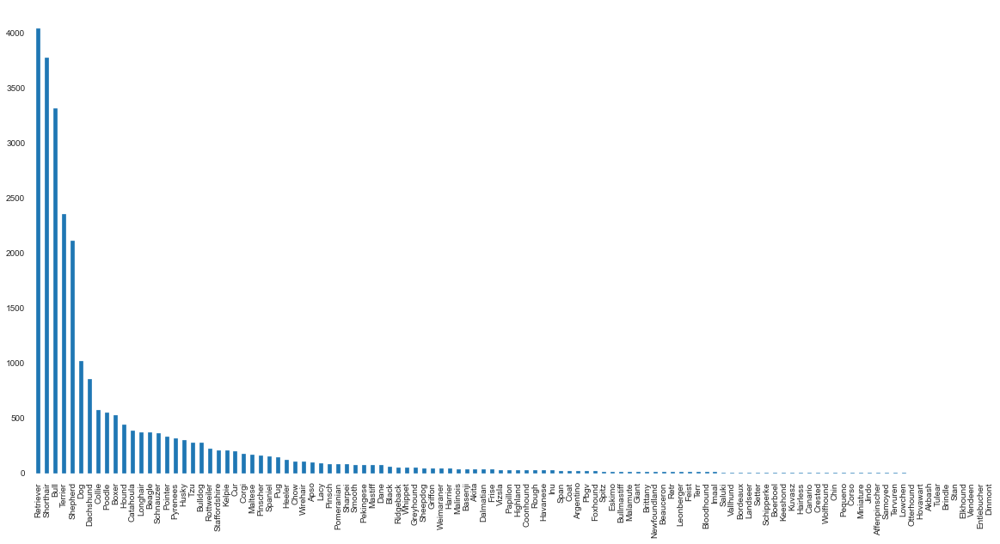

In [487]:
plt.figure(figsize=(20,10))
data[data.animal_type == 'Dog']['breed_1_type'].value_counts().plot(kind='bar')

In [489]:
data = data.merge(breed_type_stat, how='left', left_on=['animal_type', 'breed_1_type']\
           , right_on=['animal_type', 'breed_1_type'])

In [562]:
data['rank_br_top_3'] = data.rank_br_dig.apply(lambda x: 1 if x < 4 else 0)

In [563]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,...,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words
0,Cat,No name,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,...,0,20504,1,1,Orange,1,0,0,0,0
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,...,0,375,14,0,White,0,1,0,6,1
2,Dog,Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,...,0,3320,3,1,Blue,0,1,1,8,1
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,...,0,369,15,0,White,0,0,0,8,1
5,Dog,Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,...,0,3777,2,1,Brown,0,0,1,6,1


In [492]:
data.describe()

,num_of_returns,age_in_days,age_min,age_max,age_in_years,is_mix_in_breed,is_second_breed,outcome_type_y,rank_br
count,52552.000000,52552.000000,52552.000000,52552.000000,52552.000000,52552.000000,52552.000000,52552.000000,52552.000000
mean,1.072443,598.193199,486.690097,839.167111,1.566296,0.867636,0.089093,9185.743606,6.009419
std,0.295965,846.061481,633.910101,1214.019582,2.356122,0.338889,0.284880,9128.015323,11.204054
min,1.000000,0.000000,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,1.000000,77.000000,61.000000,123.000000,0.000000,1.000000,0.000000,1009.000000,1.000000
50%,1.000000,283.000000,154.000000,340.000000,1.000000,1.000000,0.000000,3777.000000,2.000000
75%,1.000000,738.000000,731.000000,1097.000000,2.000000,1.000000,0.000000,20504.000000,5.000000
max,6.000000,4800.000000,2195.000000,4800.000000,13.000000,1.000000,1.000000,20504.000000,112.000000


In [503]:
len(data[data.rank_br < 40])/len(data)

0.973340691124981

In [505]:
data.shape

(52552, 18)

In [504]:
data.animal_type.value_counts()

Dog          26621
Cat          24954
Other          766
Bird           203
Livestock        8
Name: animal_type, dtype: int64

In [506]:
data[data.rank_br < 40].shape

(51151, 18)

In [507]:
data[data.rank_br < 40].animal_type.value_counts()

Dog          25230
Cat          24954
Other          756
Bird           203
Livestock        8
Name: animal_type, dtype: int64

Можно убрать редкие записи (rank_br < 40).

In [508]:
data = data[data.rank_br < 40]
data.shape

(51151, 18)

In [510]:
data.breed_1_type.value_counts().head()

Shorthair    24281
Retriever     4044
Bull          3320
Terrier       2357
Shepherd      2113
Name: breed_1_type, dtype: int64

In [511]:
data.head()

,animal_type,color,name,outcome_subtype,outcome_type_x,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,outcome_type_y,rank_br,rank_br_top_3
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,Shorthair,0,20504,1,Top 1
1,Dog,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,0,375,14,Not top
2,Dog,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,Bull,0,3320,3,Top 3
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Schnauzer,0,369,15,Not top
5,Dog,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1,Shorthair,0,3777,2,Top 2


In [513]:
data.columns = ['animal_type', 'color', 'name', 'outcome_subtype', 'outcome_type',
       'sex_upon_outcome', 'num_of_returns', 'age_in_days', 'age_binned',
       'age_min', 'age_max', 'age_in_years', 'is_mix_in_breed', 'breed_1_type',
       'is_second_breed', 'breed_popularity', 'rank_br_dig', 'rank_br_top_3']

In [514]:
data.head()

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,Shorthair,0,20504,1,Top 1
1,Dog,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,0,375,14,Not top
2,Dog,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,Bull,0,3320,3,Top 3
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Schnauzer,0,369,15,Not top
5,Dog,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1,Shorthair,0,3777,2,Top 2


Теперь посмотрим на цвет:

In [515]:
data.color.value_counts()

Black/White               5484
Black                     4842
Brown Tabby               3828
Brown Tabby/White         1968
Orange Tabby              1830
                          ... 
White/Green                  1
Silver Lynx Point/Gray       1
Brown Tabby/Gray             1
Tricolor/Calico              1
Chocolate/Red Tick           1
Name: color, Length: 470, dtype: int64

In [516]:
data.color.str.count('/').sort_values()

0        0
21882    0
21881    0
41495    0
41496    0
        ..
23129    1
23128    1
23127    1
23165    1
52551    1
Name: color, Length: 51151, dtype: int64

In [517]:
data['color_1'], data['color_2'] = data.color.str.split('/').str

/Users/d.kolesova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [518]:
data.color_1.value_counts().head()

Black          12612
White           6013
Brown Tabby     5862
Brown           3289
Tan             3088
Name: color_1, dtype: int64

In [519]:
data.color_2.value_counts().head()

White    16421
Black     2722
Tan       2234
Brown     1851
Gray       280
Name: color_2, dtype: int64

In [520]:
data['color_1'], data['color_1_picture'] = data.color_1.str.split(' ', 1).str

/Users/d.kolesova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [521]:
data['color_2'], data['color_2_picture'] = data.color_2.str.split(' ').str

/Users/d.kolesova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [522]:
data.head()

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,...,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1,color_2,color_1_picture,color_2_picture
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,...,1,Shorthair,0,20504,1,Top 1,Orange,NaN,Tabby,NaN
1,Dog,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,...,1,Beagle,0,375,14,Not top,White,Brown,NaN,NaN
2,Dog,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,...,0,Bull,0,3320,3,Top 3,Blue,White,NaN,NaN
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,...,1,Schnauzer,0,369,15,Not top,White,NaN,NaN,NaN
5,Dog,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,...,1,Shorthair,0,3777,2,Top 2,Brown,NaN,NaN,NaN


In [523]:
# sum(
data.color_1.value_counts()
# .head(12)
# /len(data)

Black        13112
Brown        10475
White         6013
Blue          4323
Tan           3088
Orange        2880
Tortie        1330
Calico        1283
Tricolor      1266
Red           1234
Cream         1068
Torbie         909
Chocolate      752
Gray           609
Sable          495
Lynx           397
Yellow         384
Buff           334
Seal           302
Fawn           295
Flame          165
Silver         148
Gold            94
Lilac           71
Apricot         46
Green           33
Liver           20
Pink            15
Agouti           9
Ruddy            1
Name: color_1, dtype: int64

In [524]:
color_dict = {'Black': 'Black', 'Brown':'Brown', 'White':'White', 'Blue':'Blue', 'Tan': 'Orange', 'Orange':'Orange'\
            ,'Red':'Red', 'Tricolor':'Tricolor', 'Tortie':'Green', 'Calico':'Tricolor', 'Gray':'Gray', \
            'Cream':'White','Chocolate':'Brown', 'Torbie':'Tricolor', 'Sable':'Black', 'Yellow':'Orange',\
              'Fawn':'Orange', 'Buff':'Brown', 'Lynx':'Other', 'Seal':'Other', 'Silver':'Gray','Flame': 'Orange'\
            ,'Gold':'Orange', 'Lilac':'Pink', 'Apricot':'Orange', 'Liver':'Other', 'Pink':'Pink', 'Green':'Green'\
            ,'Agouti':'Gray', 'Ruddy':'Red'}

In [525]:
data['color_1_gr'] = data.color_1.map(color_dict)
data['color_2_gr'] = data.color_2.map(color_dict)

In [526]:
data[(data.color_2_gr.isna())&(data.color_2.notna())]

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,...,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1,color_2,color_1_picture,color_2_picture,color_1_gr,color_2_gr


In [527]:
data['is_color_with_picture'] = data.apply(lambda x: 0 if pd.isna(x['color_1_picture']) \
                                           and pd.isna(x['color_2_picture']) else 1, axis=1)

In [528]:
data.head()

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,...,breed_popularity,rank_br_dig,rank_br_top_3,color_1,color_2,color_1_picture,color_2_picture,color_1_gr,color_2_gr,is_color_with_picture
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,...,20504,1,Top 1,Orange,NaN,Tabby,NaN,Orange,NaN,1
1,Dog,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,...,375,14,Not top,White,Brown,NaN,NaN,White,Brown,0
2,Dog,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,...,3320,3,Top 3,Blue,White,NaN,NaN,Blue,White,0
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,...,369,15,Not top,White,NaN,NaN,NaN,White,NaN,0
5,Dog,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,...,3777,2,Top 2,Brown,NaN,NaN,NaN,Brown,NaN,0


In [529]:
data[data.color_2.isna()]

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,...,breed_popularity,rank_br_dig,rank_br_top_3,color_1,color_2,color_1_picture,color_2_picture,color_1_gr,color_2_gr,is_color_with_picture
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,...,20504,1,Top 1,Orange,NaN,Tabby,NaN,Orange,NaN,1
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,...,369,15,Not top,White,NaN,NaN,NaN,White,NaN,0
5,Dog,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,...,3777,2,Top 2,Brown,NaN,NaN,NaN,Brown,NaN,0
9,Dog,Black,Kash,Foster,Adoption,Neutered Male,1,80,"(61.0, 123.0]",61,...,3777,2,Top 2,Black,NaN,NaN,NaN,Black,NaN,0
15,Cat,Black Tabby,Chester,NaN,Adoption,Neutered Male,1,162,"(154.0, 340.0]",154,...,20504,1,Top 1,Black,NaN,Tabby,NaN,Black,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52538,Cat,Orange Tabby,Mac,NaN,Adoption,Neutered Male,1,188,"(154.0, 340.0]",154,...,2085,2,Top 2,Orange,NaN,Tabby,NaN,Orange,NaN,1
52540,Dog,White,Bailey,Foster,Adoption,Spayed Female,1,59,"(-0.001, 61.0]",0,...,4044,1,Top 1,White,NaN,NaN,NaN,White,NaN,0
52543,Dog,Brown,NaN,NaN,Adoption,Neutered Male,1,80,"(61.0, 123.0]",61,...,369,15,Not top,Brown,NaN,NaN,NaN,Brown,NaN,0
52545,Dog,White,NaN,Foster,Adoption,Spayed Female,1,59,"(-0.001, 61.0]",0,...,4044,1,Top 1,White,NaN,NaN,NaN,White,NaN,0


In [530]:
data['is_double_color'] = data.color_2.apply(lambda x: 0 if pd.isna(x) else 1)

In [531]:
data.head()

,animal_type,color,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,...,rank_br_dig,rank_br_top_3,color_1,color_2,color_1_picture,color_2_picture,color_1_gr,color_2_gr,is_color_with_picture,is_double_color
0,Cat,Orange Tabby,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,...,1,Top 1,Orange,NaN,Tabby,NaN,Orange,NaN,1,0
1,Dog,White/Brown,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,...,14,Not top,White,Brown,NaN,NaN,White,Brown,0,1
2,Dog,Blue/White,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,...,3,Top 3,Blue,White,NaN,NaN,Blue,White,0,1
3,Dog,White,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,...,15,Not top,White,NaN,NaN,NaN,White,NaN,0,0
5,Dog,Brown,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,...,2,Top 2,Brown,NaN,NaN,NaN,Brown,NaN,0,0


In [532]:
data.drop(['color', 'color_1', 'color_2', 'color_1_picture', 'color_2_picture', 'color_2_gr'], axis=1, inplace=True)

In [533]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color
0,Cat,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,Shorthair,0,20504,1,Top 1,Orange,1,0
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,0,375,14,Not top,White,0,1
2,Dog,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,Bull,0,3320,3,Top 3,Blue,0,1
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Schnauzer,0,369,15,Not top,White,0,0
5,Dog,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1,Shorthair,0,3777,2,Top 2,Brown,0,0


In [534]:
sum(data.color_1_gr.value_counts().head(6))/len(data)

0.918496217082755

In [536]:
list_of_top_colors = data.color_1_gr.value_counts().head(6).index
list_of_top_colors

Index(['Black', 'Brown', 'White', 'Orange', 'Blue', 'Tricolor'], dtype='object')

In [537]:
data['color_1_gr'] = data.color_1_gr.apply(lambda x: x if x in list_of_top_colors\
                                          else 'Other color')

In [538]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color
0,Cat,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,Shorthair,0,20504,1,Top 1,Orange,1,0
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,0,375,14,Not top,White,0,1
2,Dog,*Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,Bull,0,3320,3,Top 3,Blue,0,1
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Schnauzer,0,369,15,Not top,White,0,0
5,Dog,*Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1,Shorthair,0,3777,2,Top 2,Brown,0,0


Name

In [539]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51151 entries, 0 to 52551
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   animal_type            51151 non-null  object  
 1   name                   33681 non-null  object  
 2   outcome_subtype        28158 non-null  object  
 3   outcome_type           51151 non-null  object  
 4   sex_upon_outcome       51151 non-null  object  
 5   num_of_returns         51151 non-null  int64   
 6   age_in_days            51151 non-null  int64   
 7   age_binned             51151 non-null  category
 8   age_min                51151 non-null  int64   
 9   age_max                51151 non-null  int64   
 10  age_in_years           51151 non-null  float64 
 11  is_mix_in_breed        51151 non-null  int64   
 12  breed_1_type           51151 non-null  object  
 13  is_second_breed        51151 non-null  int64   
 14  breed_popularity       51151 non-null 

Осталось два поля с пустыми значениями - name и outcome_subtype.
Кажется, что name не может влиять на решение о приюте животного, но пока оставим ради интереса, заменим только на какое-нибудь значение, типо Unknown
А outcome_subtype посмотрим поподробнее, но скорее всего уберем его вообще, так как значение может напрямую указывать на outcome_type

In [540]:
data.name.value_counts()

Bella           165
Luna            131
Max             128
Daisy           124
Charlie         111
               ... 
*Yukon            1
*The General      1
*Platypus         1
Mantequilla       1
*Sauerkraut       1
Name: name, Length: 11708, dtype: int64

In [541]:
data_with_special_name = data[(data.name.fillna(' ').str.contains('^\W', regex=True))&(data.name.notna())]

Не понятно, зачем нужен символ * перед именем животного

In [542]:
data_with_special_name.animal_type.value_counts()

Cat      8299
Dog      7904
Other     160
Bird        7
Name: animal_type, dtype: int64

In [543]:
data_with_special_name.outcome_type.value_counts()

Adoption    10855
Transfer     5515
Name: outcome_type, dtype: int64

In [544]:
data_with_special_name.outcome_subtype.value_counts()

Partner    5434
Foster     2995
Offsite     173
SCRP         67
Snr          14
Name: outcome_subtype, dtype: int64

In [545]:
data_with_special_name.sex_upon_outcome.value_counts()

Neutered Male    7031
Spayed Female    6720
Intact Female    1393
Intact Male      1178
Unknown            48
Name: sex_upon_outcome, dtype: int64

Значения такие же как и в основном датасете, просто уберу эту звездочку, возможно, в приюте не знают точного имени и/или назвали сами. Но создам пока столбец с флагом - имя было со звездочкой или без

In [546]:
data['name'] = data.name.str.replace('*', 'SPECIAL_CH_TO_REMOVE')

In [547]:
data['is_special_name'] = np.where(data.name.str.contains('SPECIAL_CH_TO_REMOVE'), 1, 0)
data['is_special_name'] = np.where(data.name.isna(), 0, data.is_special_name)

In [548]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,...,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name
0,Cat,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,...,1,Shorthair,0,20504,1,Top 1,Orange,1,0,0
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,...,1,Beagle,0,375,14,Not top,White,0,1,0
2,Dog,SPECIAL_CH_TO_REMOVEJohnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,...,0,Bull,0,3320,3,Top 3,Blue,0,1,1
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,...,1,Schnauzer,0,369,15,Not top,White,0,0,0
5,Dog,SPECIAL_CH_TO_REMOVEElla,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,...,1,Shorthair,0,3777,2,Top 2,Brown,0,0,1


In [549]:
data['name'] = data.name.str.replace('SPECIAL_CH_TO_REMOVE', '')

In [550]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,...,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name
0,Cat,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,...,1,Shorthair,0,20504,1,Top 1,Orange,1,0,0
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,...,1,Beagle,0,375,14,Not top,White,0,1,0
2,Dog,Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,...,0,Bull,0,3320,3,Top 3,Blue,0,1,1
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,...,1,Schnauzer,0,369,15,Not top,White,0,0,0
5,Dog,Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,...,1,Shorthair,0,3777,2,Top 2,Brown,0,0,1


Создам еще столбец - из скольких слов состоит имя животного, если пустота - 0 + столбец с кол-вом букв в имени

In [552]:
data['name_num_of_letters'] = data.name.str.replace(' ', '').str.split('').str.len().fillna(0).astype('int')

In [553]:
data['name_num_of_words'] = data.name.str.split(' ').str.len().fillna(0).astype('int')

In [554]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,...,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words
0,Cat,NaN,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,...,0,20504,1,Top 1,Orange,1,0,0,0,0
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,...,0,375,14,Not top,White,0,1,0,6,1
2,Dog,Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,...,0,3320,3,Top 3,Blue,0,1,1,8,1
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,...,0,369,15,Not top,White,0,0,0,8,1
5,Dog,Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,...,0,3777,2,Top 2,Brown,0,0,1,6,1


In [555]:
data.name_num_of_words.value_counts()

1    32301
0    17470
2     1366
3       14
Name: name_num_of_words, dtype: int64

In [556]:
data['name'] = data.name.fillna('No name')

In [566]:
name_stat = data.name.value_counts().reset_index()

In [569]:
name_stat.reset_index(inplace=True)

In [571]:
name_stat.columns = ['rank_name', 'name', 'num_of_records']
name_stat

,rank_name,name,num_of_records
0,0,No name,17470
1,1,Bella,186
2,2,Charlie,184
3,3,Daisy,170
4,4,Max,169
...,...,...,...
9357,9357,Osais,1
9358,9358,Hanley,1
9359,9359,Jacqueline,1
9360,9360,Winona,1


In [573]:
data = data.merge(name_stat, how='left', left_on='name', right_on='name')

In [575]:
data['rank_name_top_10'] = data.rank_name.apply(lambda x: 1 if x < 11 else 0)

In [576]:
data.head()

,animal_type,name,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,...,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10
0,Cat,No name,Partner,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,...,1,Orange,1,0,0,0,0,0,17470,1
1,Dog,Lucy,Partner,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,...,0,White,0,1,0,6,1,6,150,1
2,Dog,Johnny,NaN,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,...,1,Blue,0,1,1,8,1,242,22,0
3,Dog,Monday,Partner,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,...,0,White,0,0,0,8,1,2963,2,0
4,Dog,Ella,Partner,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,...,1,Brown,0,0,1,6,1,122,36,0


In [578]:
data.drop(['name'], axis=1, inplace=True)

In [579]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51151 entries, 0 to 51150
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   animal_type            51151 non-null  object  
 1   outcome_subtype        28158 non-null  object  
 2   outcome_type           51151 non-null  object  
 3   sex_upon_outcome       51151 non-null  object  
 4   num_of_returns         51151 non-null  int64   
 5   age_in_days            51151 non-null  int64   
 6   age_binned             51151 non-null  category
 7   age_min                51151 non-null  int64   
 8   age_max                51151 non-null  int64   
 9   age_in_years           51151 non-null  float64 
 10  is_mix_in_breed        51151 non-null  int64   
 11  breed_1_type           51151 non-null  object  
 12  is_second_breed        51151 non-null  int64   
 13  breed_popularity       51151 non-null  int64   
 14  rank_br_dig            51151 non-null 

In [584]:
data.describe(include='all')

,animal_type,outcome_subtype,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,...,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10
count,51151,28158,51151,51151,51151.000000,51151.000000,51151,51151.000000,51151.000000,51151.000000,...,51151.000000,51151,51151.000000,51151.000000,51151.000000,51151.000000,51151.000000,51151.000000,51151.000000,51151.000000
unique,5,6,2,5,NaN,NaN,11,NaN,NaN,NaN,...,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Dog,Partner,Adoption,Neutered Male,NaN,NaN,"(61.0, 123.0]",NaN,NaN,NaN,...,NaN,Black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,25230,18983,28493,18098,NaN,NaN,11547,NaN,NaN,NaN,...,NaN,13607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,1.071123,590.286466,NaN,479.938672,828.528807,1.543235,...,0.690935,NaN,0.300405,0.499541,0.320052,4.998221,0.685715,1169.191296,5982.526383,0.370218
std,NaN,NaN,NaN,NaN,0.292335,842.015082,NaN,630.946309,1208.413662,2.345321,...,0.462113,NaN,0.458438,0.500005,0.466501,3.826549,0.520161,2115.824716,8273.425110,0.482868
min,NaN,NaN,NaN,NaN,1.000000,0.000000,NaN,0.000000,61.000000,0.000000,...,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,NaN,NaN,NaN,NaN,1.000000,76.000000,NaN,61.000000,123.000000,0.000000,...,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000
50%,NaN,NaN,NaN,NaN,1.000000,266.000000,NaN,154.000000,340.000000,1.000000,...,1.000000,NaN,0.000000,0.000000,0.000000,6.000000,1.000000,144.000000,31.000000,0.000000
75%,NaN,NaN,NaN,NaN,1.000000,738.000000,NaN,731.000000,1097.000000,2.000000,...,1.000000,NaN,1.000000,1.000000,1.000000,8.000000,1.000000,1205.000000,17470.000000,1.000000


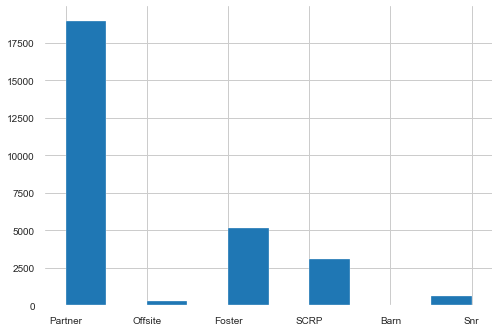

In [585]:
data.outcome_subtype.hist()

In [586]:
data.outcome_subtype.value_counts()

Partner    18983
Foster      5184
SCRP        3060
Snr          613
Offsite      315
Barn           3
Name: outcome_subtype, dtype: int64

Barn встречается крайне редко - уберем эти значения

In [588]:
data = data[data.outcome_subtype != 'Barn']

Теперь посмотрим зависмость outcome_subtype и outcome_type

In [590]:
data.groupby('outcome_type')['outcome_subtype'].nunique()

outcome_type
Adoption    2
Transfer    3
Name: outcome_subtype, dtype: int64

In [591]:
data.groupby('outcome_subtype')['outcome_type'].nunique()

outcome_subtype
Foster     1
Offsite    1
Partner    1
SCRP       1
Snr        1
Name: outcome_type, dtype: int64

In [592]:
data.groupby(['outcome_subtype', 'outcome_type'])['animal_type'].count()

outcome_subtype  outcome_type
Foster           Adoption         5184
Offsite          Adoption          315
Partner          Transfer        18983
SCRP             Transfer         3060
Snr              Transfer          613
Name: animal_type, dtype: int64

Чаще всего outcome_subtype указывает на конкретный outcome_type (кол-во уникальных outcome_type = 1)

In [593]:
data.profile_report()

Profiler подтвердил, что subtype сильно коррелирует с type - на мой взгляд, нужно убирать этот столбец

In [594]:
data.drop(['outcome_subtype'], axis=1, inplace=True)

In [595]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51148 entries, 0 to 51150
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   animal_type            51148 non-null  object  
 1   outcome_type           51148 non-null  object  
 2   sex_upon_outcome       51148 non-null  object  
 3   num_of_returns         51148 non-null  int64   
 4   age_in_days            51148 non-null  int64   
 5   age_binned             51148 non-null  category
 6   age_min                51148 non-null  int64   
 7   age_max                51148 non-null  int64   
 8   age_in_years           51148 non-null  float64 
 9   is_mix_in_breed        51148 non-null  int64   
 10  breed_1_type           51148 non-null  object  
 11  is_second_breed        51148 non-null  int64   
 12  breed_popularity       51148 non-null  int64   
 13  rank_br_dig            51148 non-null  int64   
 14  rank_br_top_3          51148 non-null 

Почистили все пустые значения и заодно сделали некоторые преобразования.

In [596]:
data.head()

,animal_type,outcome_type,sex_upon_outcome,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,...,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10
0,Cat,Transfer,Intact Male,1,15,"(-0.001, 61.0]",0,61,0.0,1,...,1,Orange,1,0,0,0,0,0,17470,1
1,Dog,Transfer,Spayed Female,1,366,"(340.0, 371.0]",340,371,1.0,1,...,0,White,0,1,0,6,1,6,150,1
2,Dog,Adoption,Neutered Male,1,429,"(371.0, 731.0]",371,731,1.0,0,...,1,Blue,0,1,1,8,1,242,22,0
3,Dog,Transfer,Neutered Male,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,...,0,White,0,0,0,8,1,2963,2,0
4,Dog,Transfer,Spayed Female,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1,...,1,Brown,0,0,1,6,1,122,36,0


In [597]:
data.animal_type.value_counts()

Dog          25229
Cat          24952
Other          756
Bird           203
Livestock        8
Name: animal_type, dtype: int64

Очень редко встречаются не собаки и не кошки - объединим их в одну группу

In [598]:
data['animal_type'] = data.animal_type.apply(lambda x: x if x== 'Dog' or x=='Cat' else 'Other_animal_type' )

In [599]:
data.animal_type.value_counts()

Dog                  25229
Cat                  24952
Other_animal_type      967
Name: animal_type, dtype: int64

In [601]:
data.sex_upon_outcome.value_counts()

Neutered Male    18096
Spayed Female    17498
Intact Female     6686
Intact Male       6117
Unknown           2751
Name: sex_upon_outcome, dtype: int64

In [602]:
data['sterilized'], data['gender'] = data['sex_upon_outcome'].str.split(' ').str

/Users/d.kolesova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [603]:
data.sterilized.value_counts()

Neutered    18096
Spayed      17498
Intact      12803
Unknown      2751
Name: sterilized, dtype: int64

In [604]:
data.gender.value_counts()

Male      24213
Female    24184
Name: gender, dtype: int64

Заметила, что Neutered и Spayed это по сути одно и тоже, просто одно для мальчиков, другое для девочек - объединим это в один признак -  sterilized


In [605]:
data['sterilized'] = data.sterilized.apply(lambda x: 'Sterilized' if x == 'Neutered' or x == 'Spayed'\
                                           else x)

In [606]:
data.sterilized.value_counts()

Sterilized    35594
Intact        12803
Unknown        2751
Name: sterilized, dtype: int64

Sterilized и Intact являются одним и тем же признаком, просто с разных сторон, к тому же если неизвестно стерилизлван или нет, то тут примерно такие же ожидания как и от Intact. Поэтому объединим Intact и Unknown в один признак.

In [607]:
data['sterilized'] = data.sterilized.apply(lambda x: 1 if x == 'Sterilized' else 0)

In [612]:
data.drop(['sex_upon_outcome'], axis=1, inplace=True)

In [616]:
pd.options.display.max_columns= 30
data.describe(include='all')

,animal_type,outcome_type,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10,sterilized,gender
count,51148,51148,51148.000000,51148.000000,51148,51148.000000,51148.000000,51148.000000,51148.000000,51148,51148.000000,51148.000000,51148.000000,51148.000000,51148,51148.000000,51148.000000,51148.000000,51148.000000,51148.000000,51148.000000,51148.000000,51148.000000,51148.000000,48397
unique,3,2,NaN,NaN,11,NaN,NaN,NaN,NaN,139,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,Dog,Adoption,NaN,NaN,"(61.0, 123.0]",NaN,NaN,NaN,NaN,Shorthair,NaN,NaN,NaN,NaN,Black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Male
freq,25229,28492,NaN,NaN,11547,NaN,NaN,NaN,NaN,24279,NaN,NaN,NaN,NaN,13606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24213
mean,NaN,NaN,1.071127,590.249042,NaN,479.895323,828.484437,1.543130,0.872194,NaN,0.085067,9436.088351,4.593650,0.690936,NaN,0.300403,0.499550,0.320071,4.998221,0.685716,1169.252209,5982.533745,0.370220,0.695902,NaN
std,NaN,NaN,0.292343,842.024509,NaN,630.938039,1208.434490,2.345347,0.333876,NaN,0.278984,9123.900909,6.851988,0.462112,NaN,0.458438,0.500005,0.466508,3.826564,0.520164,2115.871402,8273.428663,0.482868,0.460029,NaN
min,NaN,NaN,1.000000,0.000000,NaN,0.000000,61.000000,0.000000,0.000000,NaN,0.000000,1.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,NaN
25%,NaN,NaN,1.000000,76.000000,NaN,61.000000,123.000000,0.000000,1.000000,NaN,0.000000,1024.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,NaN
50%,NaN,NaN,1.000000,266.000000,NaN,154.000000,340.000000,1.000000,1.000000,NaN,0.000000,3777.000000,2.000000,1.000000,NaN,0.000000,0.000000,0.000000,6.000000,1.000000,144.000000,31.000000,0.000000,1.000000,NaN
75%,NaN,NaN,1.000000,738.000000,NaN,731.000000,1097.000000,2.000000,1.000000,NaN,0.000000,20504.000000,4.000000,1.000000,NaN,1.000000,1.000000,1.000000,8.000000,1.000000,1205.000000,17470.000000,1.000000,1.000000,NaN


Что мне не нравится:
1. animal_type - Other_animal_type очень редко встречается, можно убрать
2. num_of_returns - макс значение и 75 квантиль очень отличаются
3. is_second_breed - 1-ца встречается редко
4. name_num_of_words - имя с 3 словами очень редко
5. сильные зависимости - 'age_in_days', 'age_binned', 'age_min', 'age_max', 'age_in_years' | будем брать только стобец из этих
6. сильные зависимости - 'name_num_of_letters', 'name_num_of_words', 'num_of_records', rank_name_top_10 | будем брать только стобец из этих

In [633]:
data.columns

Index(['animal_type', 'outcome_type', 'num_of_returns', 'age_in_days',
       'age_binned', 'age_min', 'age_max', 'age_in_years', 'is_mix_in_breed',
       'breed_1_type', 'is_second_breed', 'breed_popularity', 'rank_br_dig',
       'rank_br_top_3', 'color_1_gr', 'is_color_with_picture',
       'is_double_color', 'is_special_name', 'name_num_of_letters',
       'name_num_of_words', 'rank_name', 'num_of_records', 'rank_name_top_10',
       'sterilized', 'gender'],
      dtype='object')

In [619]:
data_full = pd.DataFrame(data)

In [696]:
# data = pd.DataFrame(data_full)

In [697]:
data.animal_type.value_counts()

Dog                  25229
Cat                  24952
Other_animal_type      967
Name: animal_type, dtype: int64

In [698]:
data = data[data.animal_type != 'Other_animal_type']

In [699]:
data.describe(include='all')

,animal_type,outcome_type,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10,sterilized,gender
count,50181,50181,50181.000000,50181.000000,50181,50181.000000,50181.000000,50181.000000,50181.000000,50181,50181.000000,50181.000000,50181.000000,50181.000000,50181,50181.000000,50181.000000,50181.000000,50181.000000,50181.000000,50181.000000,50181.000000,50181.000000,50181.000000,47819
unique,2,2,NaN,NaN,11,NaN,NaN,NaN,NaN,68,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,Dog,Adoption,NaN,NaN,"(61.0, 123.0]",NaN,NaN,NaN,NaN,Shorthair,NaN,NaN,NaN,NaN,Black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female
freq,25229,28174,NaN,NaN,11499,NaN,NaN,NaN,NaN,24279,NaN,NaN,NaN,NaN,13396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23935
mean,NaN,NaN,1.072378,593.226241,NaN,481.868197,832.978020,1.549830,0.873956,NaN,0.086646,9615.727706,4.572468,0.692234,NaN,0.305933,0.499651,0.322911,5.022758,0.688886,1169.632889,5917.326936,0.366792,0.706164,NaN
std,NaN,NaN,0.294804,847.809409,NaN,634.924508,1216.954617,2.361773,0.331902,NaN,0.281319,9118.257566,6.837999,0.461574,NaN,0.460806,0.500005,0.467594,3.814705,0.517931,2113.534389,8251.291755,0.481934,0.455522,NaN
min,NaN,NaN,1.000000,0.000000,NaN,0.000000,61.000000,0.000000,0.000000,NaN,0.000000,1.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,NaN
25%,NaN,NaN,1.000000,75.000000,NaN,61.000000,123.000000,0.000000,1.000000,NaN,0.000000,2085.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,NaN
50%,NaN,NaN,1.000000,254.000000,NaN,154.000000,340.000000,1.000000,1.000000,NaN,0.000000,3777.000000,2.000000,1.000000,NaN,0.000000,0.000000,0.000000,6.000000,1.000000,148.000000,31.000000,0.000000,1.000000,NaN
75%,NaN,NaN,1.000000,738.000000,NaN,731.000000,1097.000000,2.000000,1.000000,NaN,0.000000,20504.000000,4.000000,1.000000,NaN,1.000000,1.000000,1.000000,8.000000,1.000000,1207.000000,17470.000000,1.000000,1.000000,NaN


In [700]:
data[data.num_of_returns > 2].shape

(377, 25)

In [701]:
data.shape

(50181, 25)

In [702]:
data = data[data.num_of_returns <= 2]

In [703]:
data.describe(include='all')

,animal_type,outcome_type,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10,sterilized,gender
count,49804,49804,49804.000000,49804.000000,49804,49804.000000,49804.000000,49804.000000,49804.000000,49804,49804.000000,49804.000000,49804.000000,49804.000000,49804,49804.000000,49804.000000,49804.000000,49804.000000,49804.000000,49804.000000,49804.000000,49804.000000,49804.000000,47442
unique,2,2,NaN,NaN,11,NaN,NaN,NaN,NaN,68,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,Dog,Adoption,NaN,NaN,"(61.0, 123.0]",NaN,NaN,NaN,NaN,Shorthair,NaN,NaN,NaN,NaN,Black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female
freq,24923,27896,NaN,NaN,11494,NaN,NaN,NaN,NaN,24202,NaN,NaN,NaN,NaN,13300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23739
mean,NaN,NaN,1.056682,589.692434,NaN,479.082323,828.574050,1.539836,0.874388,NaN,0.086318,9652.687917,4.553450,0.693639,NaN,0.306883,0.498454,0.323729,5.006345,0.686551,1168.218737,5958.740061,0.368946,0.703939,NaN
std,NaN,NaN,0.231237,846.745018,NaN,634.148067,1215.676936,2.358924,0.331415,NaN,0.280836,9124.357660,6.823396,0.460986,NaN,0.461205,0.500003,0.467903,3.821310,0.518860,2113.093020,8265.424832,0.482524,0.456523,NaN
min,NaN,NaN,1.000000,0.000000,NaN,0.000000,61.000000,0.000000,0.000000,NaN,0.000000,1.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,NaN
25%,NaN,NaN,1.000000,75.000000,NaN,61.000000,123.000000,0.000000,1.000000,NaN,0.000000,2085.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,NaN
50%,NaN,NaN,1.000000,250.000000,NaN,154.000000,340.000000,1.000000,1.000000,NaN,0.000000,3777.000000,2.000000,1.000000,NaN,0.000000,0.000000,0.000000,6.000000,1.000000,146.000000,31.000000,0.000000,1.000000,NaN
75%,NaN,NaN,1.000000,738.000000,NaN,731.000000,1097.000000,2.000000,1.000000,NaN,0.000000,20504.000000,4.000000,1.000000,NaN,1.000000,1.000000,1.000000,8.000000,1.000000,1203.250000,17470.000000,1.000000,1.000000,NaN


In [704]:
data.is_second_breed.value_counts()

0    45505
1     4299
Name: is_second_breed, dtype: int64

In [705]:
data.name_num_of_words.value_counts()

1    31545
0    16942
2     1303
3       14
Name: name_num_of_words, dtype: int64

In [706]:
data = data[data.name_num_of_words < 3]

In [707]:
data.describe(include='all')

,animal_type,outcome_type,num_of_returns,age_in_days,age_binned,age_min,age_max,age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,name_num_of_letters,name_num_of_words,rank_name,num_of_records,rank_name_top_10,sterilized,gender
count,49790,49790,49790.000000,49790.000000,49790,49790.00000,49790.000000,49790.000000,49790.000000,49790,49790.000000,49790.000000,49790.000000,49790.000000,49790,49790.000000,49790.000000,49790.000000,49790.000000,49790.000000,49790.000000,49790.000000,49790.000000,49790.000000,47428
unique,2,2,NaN,NaN,11,NaN,NaN,NaN,NaN,68,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,Dog,Adoption,NaN,NaN,"(61.0, 123.0]",NaN,NaN,NaN,NaN,Shorthair,NaN,NaN,NaN,NaN,Black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female
freq,24917,27887,NaN,NaN,11491,NaN,NaN,NaN,NaN,24193,NaN,NaN,NaN,NaN,13296,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23730
mean,NaN,NaN,1.056698,589.721410,NaN,479.10231,828.587066,1.539908,0.874372,NaN,0.086323,9652.250894,4.553224,0.693633,NaN,0.306889,0.498514,0.323740,5.004680,0.685901,1167.002611,5960.415224,0.369050,0.703916,NaN
std,NaN,NaN,0.231267,846.795913,NaN,634.16709,1215.688634,2.359061,0.331433,NaN,0.280843,9124.255892,6.822848,0.460989,NaN,0.461208,0.500003,0.467907,3.820512,0.517481,2111.932581,8265.982979,0.482552,0.456533,NaN
min,NaN,NaN,1.000000,0.000000,NaN,0.00000,61.000000,0.000000,0.000000,NaN,0.000000,1.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,NaN
25%,NaN,NaN,1.000000,75.000000,NaN,61.00000,123.000000,0.000000,1.000000,NaN,0.000000,2085.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,NaN
50%,NaN,NaN,1.000000,250.000000,NaN,154.00000,340.000000,1.000000,1.000000,NaN,0.000000,3777.000000,2.000000,1.000000,NaN,0.000000,0.000000,0.000000,6.000000,1.000000,145.000000,31.000000,0.000000,1.000000,NaN
75%,NaN,NaN,1.000000,738.000000,NaN,731.00000,1097.000000,2.000000,1.000000,NaN,0.000000,20504.000000,4.000000,1.000000,NaN,1.000000,1.000000,1.000000,8.000000,1.000000,1202.000000,17470.000000,1.000000,1.000000,NaN


In [708]:
data[data.rank_name > 2000].shape

(9113, 25)

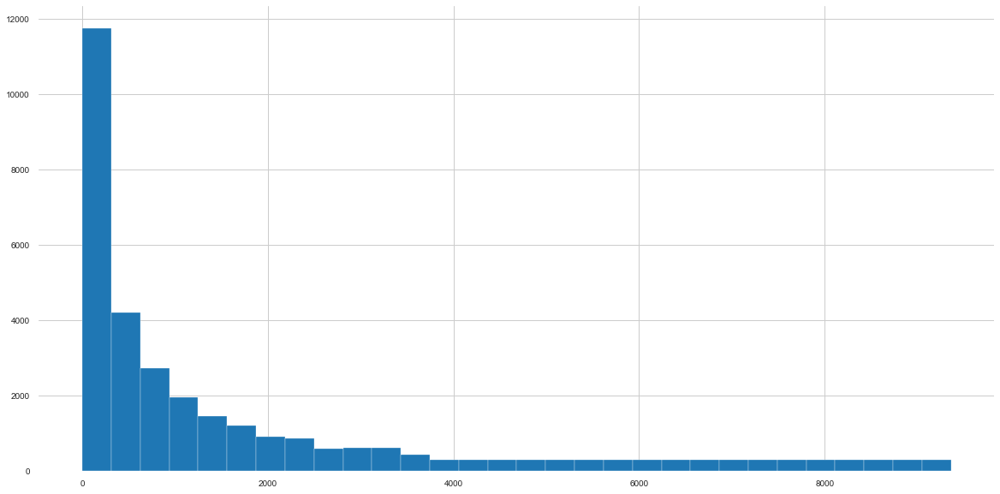

In [709]:
plt.figure(figsize=(20,10))
data[data.rank_name != 0].rank_name.hist(bins=30)

In [710]:
data[data.rank_name > 8000].shape

(1313, 25)

In [711]:
data.columns

Index(['animal_type', 'outcome_type', 'num_of_returns', 'age_in_days',
       'age_binned', 'age_min', 'age_max', 'age_in_years', 'is_mix_in_breed',
       'breed_1_type', 'is_second_breed', 'breed_popularity', 'rank_br_dig',
       'rank_br_top_3', 'color_1_gr', 'is_color_with_picture',
       'is_double_color', 'is_special_name', 'name_num_of_letters',
       'name_num_of_words', 'rank_name', 'num_of_records', 'rank_name_top_10',
       'sterilized', 'gender'],
      dtype='object')

In [712]:
data.columns = ['animal_type', 'outcome_type', 'num_of_returns', 'HC1_age_in_days',
       'HC1_age_binned', 'HC1_age_min', 'HC1_age_max', 'HC1_age_in_years', 'is_mix_in_breed',
       'breed_1_type', 'is_second_breed', 'breed_popularity', 'rank_br_dig',
       'rank_br_top_3', 'color_1_gr', 'is_color_with_picture',
       'is_double_color', 'is_special_name', 'HC2_name_num_of_letters',
       'HC2_name_num_of_words', 'rank_name', 'HC2_num_of_records', 'HC2_rank_name_top_10',
       'sterilized', 'gender']

In [713]:
data.head()

,animal_type,outcome_type,num_of_returns,HC1_age_in_days,HC1_age_binned,HC1_age_min,HC1_age_max,HC1_age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,HC2_name_num_of_letters,HC2_name_num_of_words,rank_name,HC2_num_of_records,HC2_rank_name_top_10,sterilized,gender
0,Cat,Transfer,1,15,"(-0.001, 61.0]",0,61,0.0,1,Shorthair,0,20504,1,1,Orange,1,0,0,0,0,0,17470,1,0,Male
1,Dog,Transfer,1,366,"(340.0, 371.0]",340,371,1.0,1,Beagle,0,375,14,0,White,0,1,0,6,1,6,150,1,1,Female
2,Dog,Adoption,1,429,"(371.0, 731.0]",371,731,1.0,0,Bull,0,3320,3,1,Blue,0,1,1,8,1,242,22,0,1,Male
3,Dog,Transfer,1,3300,"(2195.0, 4800.0]",2195,4800,9.0,1,Schnauzer,0,369,15,0,White,0,0,0,8,1,2963,2,0,1,Male
4,Dog,Transfer,1,1111,"(1097.0, 1463.0]",1097,1463,3.0,1,Shorthair,0,3777,2,1,Brown,0,0,1,6,1,122,36,0,1,Female


In [714]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49790 entries, 0 to 51150
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   animal_type              49790 non-null  object  
 1   outcome_type             49790 non-null  object  
 2   num_of_returns           49790 non-null  int64   
 3   HC1_age_in_days          49790 non-null  int64   
 4   HC1_age_binned           49790 non-null  category
 5   HC1_age_min              49790 non-null  int64   
 6   HC1_age_max              49790 non-null  int64   
 7   HC1_age_in_years         49790 non-null  float64 
 8   is_mix_in_breed          49790 non-null  int64   
 9   breed_1_type             49790 non-null  object  
 10  is_second_breed          49790 non-null  int64   
 11  breed_popularity         49790 non-null  int64   
 12  rank_br_dig              49790 non-null  int64   
 13  rank_br_top_3            49790 non-null  int64   
 14  color_

In [715]:
data.gender.value_counts()

Female    23730
Male      23698
Name: gender, dtype: int64

In [716]:
data[data.gender.isna()].shape

(2362, 25)

In [717]:
data['gender'] = data.gender.fillna('No gender info')

In [719]:
data.drop_duplicates().shape

(43797, 25)

In [720]:
data.drop_duplicates(inplace=True)

In [729]:
data.drop(['HC1_age_binned'], axis=1, inplace=True)

In [740]:
data.reset_index(drop=True, inplace=True)

In [741]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43797 entries, 0 to 43796
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   animal_type              43797 non-null  object 
 1   outcome_type             43797 non-null  object 
 2   num_of_returns           43797 non-null  int64  
 3   HC1_age_in_days          43797 non-null  int64  
 4   HC1_age_min              43797 non-null  int64  
 5   HC1_age_max              43797 non-null  int64  
 6   HC1_age_in_years         43797 non-null  float64
 7   is_mix_in_breed          43797 non-null  int64  
 8   breed_1_type             43797 non-null  int64  
 9   is_second_breed          43797 non-null  int64  
 10  breed_popularity         43797 non-null  int64  
 11  rank_br_dig              43797 non-null  int64  
 12  rank_br_top_3            43797 non-null  int64  
 13  color_1_gr               43797 non-null  int64  
 14  is_color_with_picture 

In [731]:
cat_col = ['animal_type', 'outcome_type', 'breed_1_type', 'color_1_gr', 'gender']

In [732]:
dig_col = list(set(data.columns) - set(cat_col))

In [726]:
ohe = OneHotEncoder()
le = LabelEncoder()

In [727]:
def onehot_df(col_name):
    col_name_ohe = ohe.fit_transform(data[[col_name]]).toarray()
    col_name_columns = ohe.categories_[0]
    col_name_df = pd.DataFrame(col_name_ohe, columns=col_name_columns)
    return col_name_df

In [728]:
def labelencode_df(col_name):
    col_name_le = le.fit_transform(data[col_name])
    return col_name_le

In [733]:
data['breed_1_type'] = le.fit_transform(data.breed_1_type)

In [734]:
data['color_1_gr'] = le.fit_transform(data.color_1_gr)

In [742]:
onehot_df('gender')

,Female,Male,No gender info
0,0.0,1.0,0.0
1,1.0,0.0,0.0
2,0.0,1.0,0.0
3,0.0,1.0,0.0
4,1.0,0.0,0.0
...,...,...,...
43792,1.0,0.0,0.0
43793,0.0,1.0,0.0
43794,0.0,1.0,0.0
43795,1.0,0.0,0.0


In [743]:
data.shape

(43797, 24)

In [744]:
data = pd.concat([data, onehot_df('animal_type')], axis=1)
print(data.shape)
data.head()

(43797, 26)


,animal_type,outcome_type,num_of_returns,HC1_age_in_days,HC1_age_min,HC1_age_max,HC1_age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,HC2_name_num_of_letters,HC2_name_num_of_words,rank_name,HC2_num_of_records,HC2_rank_name_top_10,sterilized,gender,Cat,Dog
0,Cat,Transfer,1,15,0,61,0.0,1,56,0,20504,1,1,3,1,0,0,0,0,0,17470,1,0,Male,1.0,0.0
1,Dog,Transfer,1,366,340,371,1.0,1,4,0,375,14,0,6,0,1,0,6,1,6,150,1,1,Female,0.0,1.0
2,Dog,Adoption,1,429,371,731,1.0,0,12,0,3320,3,1,1,0,1,1,8,1,242,22,0,1,Male,0.0,1.0
3,Dog,Transfer,1,3300,2195,4800,9.0,1,52,0,369,15,0,6,0,0,0,8,1,2963,2,0,1,Male,0.0,1.0
4,Dog,Transfer,1,1111,1097,1463,3.0,1,56,0,3777,2,1,2,0,0,1,6,1,122,36,0,1,Female,0.0,1.0


In [745]:
data.shape

(43797, 26)

In [746]:
data = pd.concat([data, onehot_df('gender')], axis=1)
print(data.shape)
data.head()

(43797, 29)


,animal_type,outcome_type,num_of_returns,HC1_age_in_days,HC1_age_min,HC1_age_max,HC1_age_in_years,is_mix_in_breed,breed_1_type,is_second_breed,breed_popularity,rank_br_dig,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,HC2_name_num_of_letters,HC2_name_num_of_words,rank_name,HC2_num_of_records,HC2_rank_name_top_10,sterilized,gender,Cat,Dog,Female,Male,No gender info
0,Cat,Transfer,1,15,0,61,0.0,1,56,0,20504,1,1,3,1,0,0,0,0,0,17470,1,0,Male,1.0,0.0,0.0,1.0,0.0
1,Dog,Transfer,1,366,340,371,1.0,1,4,0,375,14,0,6,0,1,0,6,1,6,150,1,1,Female,0.0,1.0,1.0,0.0,0.0
2,Dog,Adoption,1,429,371,731,1.0,0,12,0,3320,3,1,1,0,1,1,8,1,242,22,0,1,Male,0.0,1.0,0.0,1.0,0.0
3,Dog,Transfer,1,3300,2195,4800,9.0,1,52,0,369,15,0,6,0,0,0,8,1,2963,2,0,1,Male,0.0,1.0,0.0,1.0,0.0
4,Dog,Transfer,1,1111,1097,1463,3.0,1,56,0,3777,2,1,2,0,0,1,6,1,122,36,0,1,Female,0.0,1.0,1.0,0.0,0.0


In [747]:
data.drop(['animal_type', 'gender'], axis=1, inplace=True)

In [748]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43797 entries, 0 to 43796
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   outcome_type             43797 non-null  object 
 1   num_of_returns           43797 non-null  int64  
 2   HC1_age_in_days          43797 non-null  int64  
 3   HC1_age_min              43797 non-null  int64  
 4   HC1_age_max              43797 non-null  int64  
 5   HC1_age_in_years         43797 non-null  float64
 6   is_mix_in_breed          43797 non-null  int64  
 7   breed_1_type             43797 non-null  int64  
 8   is_second_breed          43797 non-null  int64  
 9   breed_popularity         43797 non-null  int64  
 10  rank_br_dig              43797 non-null  int64  
 11  rank_br_top_3            43797 non-null  int64  
 12  color_1_gr               43797 non-null  int64  
 13  is_color_with_picture    43797 non-null  int64  
 14  is_double_color       

In [749]:
data.columns

Index(['outcome_type', 'num_of_returns', 'HC1_age_in_days', 'HC1_age_min',
       'HC1_age_max', 'HC1_age_in_years', 'is_mix_in_breed', 'breed_1_type',
       'is_second_breed', 'breed_popularity', 'rank_br_dig', 'rank_br_top_3',
       'color_1_gr', 'is_color_with_picture', 'is_double_color',
       'is_special_name', 'HC2_name_num_of_letters', 'HC2_name_num_of_words',
       'rank_name', 'HC2_num_of_records', 'HC2_rank_name_top_10', 'sterilized',
       'Cat', 'Dog', 'Female', 'Male', 'No gender info'],
      dtype='object')

In [932]:
data_w_sterill = pd.DataFrame(data)

In [933]:
data.sterilized.value_counts()

1    33768
0    10029
Name: sterilized, dtype: int64

In [926]:
uncorr_columns = [
    'num_of_returns',
#                   , 'HC1_age_in_days'
#                   'HC1_age_min',
#                   , 'HC1_age_max',
                  'HC1_age_in_years',
                  'is_mix_in_breed',
#                   'is_second_breed',
#                   'breed_1_type',
#                 'breed_popularity',
#                   , 'rank_br_dig', 
                  'rank_br_top_3',
       'color_1_gr', 
    'is_color_with_picture', 'is_double_color',
       'is_special_name',
#                   'HC2_name_num_of_letters'
#                   'HC2_name_num_of_words'
#                    'HC2_num_of_records',
                  'HC2_rank_name_top_10',
#                   'rank_name',
                  'sterilized'
#                    'Cat', 'Dog', 
#     'Female', 'Male'
#     , 'No gender info'
                 ]

In [927]:
X = data.drop(['outcome_type'], axis=1)
y = data.outcome_type
stand_scaler = StandardScaler()
X_dig = pd.DataFrame(stand_scaler.fit_transform(X[uncorr_columns]), columns=uncorr_columns)
X_dig.head()

,num_of_returns,HC1_age_in_years,is_mix_in_breed,rank_br_top_3,color_1_gr,is_color_with_picture,is_double_color,is_special_name,HC2_rank_name_top_10,sterilized
0,-0.261986,-0.694112,0.404598,0.714202,0.261844,1.578704,-1.043100,-0.762986,1.591858,-1.834948
1,-0.261986,-0.287025,0.404598,-1.400163,1.711350,-0.633431,0.958681,-0.762986,1.591858,0.544974
2,-0.261986,-0.287025,-2.471588,0.714202,-0.704492,-0.633431,0.958681,1.310640,-0.628197,0.544974
3,-0.261986,2.969671,0.404598,-1.400163,1.711350,-0.633431,-1.043100,-0.762986,-0.628197,0.544974
4,-0.261986,0.527149,0.404598,0.714202,-0.221324,-0.633431,-1.043100,1.310640,-0.628197,0.544974


In [928]:
# X = pd.concat([X_cat, X_dig], axis=1)
# X = pd.DataFrame(X_dig)
X = X[uncorr_columns]
X_train, X_test, y_train, y_test = train_test_split(X,y)

y_train = pd.factorize(y_train)[0]

X_train.shape, X_test.shape

((32847, 10), (10950, 10))

In [929]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_jobs=2, random_state=0)
rfc.fit(X_train, y_train)
train_predict = rfc.predict(X_train)
test_predict = rfc.predict(X_test)

# print(f'Train MAE: {mean_absolute_error(train_predict, y_train)}')
# print(f'Test MAE: {mean_absolute_error(test_predict, y_test)}')

preds = data.outcome_type[rfc.predict(X_test)]

In [930]:
d = dict()
for x,y in zip(rfc.feature_importances_, X.columns):
    d[y] = x
res_df = pd.DataFrame.from_dict(d, orient='index').reset_index()
res_df.columns = ['attr', 'coef']
res_df['abs_coef'] = np.abs(res_df.coef)
res_df.sort_values('abs_coef', ascending=False)

df = pd.DataFrame(list(zip(y_test, preds)))
df.columns = ['y_test', 'preds']
df['diff_test'] = df.apply(lambda x: 0 if x['y_test'] == x['preds'] else 1, axis=1)

df.diff_test.sum()/len(df)

0.6117808219178082

In [931]:
res_df.sort_values('abs_coef', ascending=False)

,attr,coef,abs_coef
9,sterilized,0.548176,0.548176
1,HC1_age_in_years,0.179663,0.179663
4,color_1_gr,0.084681,0.084681
8,HC2_rank_name_top_10,0.076094,0.076094
7,is_special_name,0.029506,0.029506
3,rank_br_top_3,0.022516,0.022516
6,is_double_color,0.017232,0.017232
5,is_color_with_picture,0.015719,0.015719
2,is_mix_in_breed,0.014897,0.014897
0,num_of_returns,0.011515,0.011515
